# Rainfall Prediction - Weather Forecasting

# Problem Statement:
Rain Prediction –Weather forecasting

Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:

Problem Statement: a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.
b) Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import os
import scipy as stats
from sklearn.utils import shuffle
%matplotlib inline
warnings.filterwarnings('ignore')

# Importing Dataset

In [2]:
# Reading the csv file from dataset
df = pd.read_csv("https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv")
pd.set_option("display.max_columns",None)
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


Here We have imported the dataset using pd.read_csv and set the option to display all the columns present in the dataset. The dataset contains about 10 years of daily weather observations of different locations in Australia.

This dataset is comprised of 23 columns including two target variables RainTomorrow and Rainfall where we need to predict both RainTomorrow and Rainfall.

FEATURES:
Date - The date of observation

Location -The common name of the location of the weather station

MinTemp -The minimum temperature in degrees celsius

MaxTemp -The maximum temperature in degrees celsius

Evaporation -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

Sunshine -The number of hours of bright sunshine in the day.

WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight

WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

WindDir9am -Direction of the wind at 9am

WindDir3pm -Direction of the wind at 3pm

WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am

WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

Humidity9am -Humidity (percent) at 9am

Humidity3pm -Humidity (percent) at 3pm

Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am

Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

Cloud9am - Fraction of sky obscured by cloud at 9am.

Cloud3pm -Fraction of sky obscured by cloud

Temp9am-Temperature (degrees C) at 9am

Temp3pm -Temperature (degrees C) at 3pm

RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

LABELS:

RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk"

Rainfall -The amount of rainfall recorded for the day in mm


# Exploratory Data Analysis (EDA)

In [3]:
df.shape

(8425, 23)

The dataset contains 8425 rows and 23 columns.

In [4]:
# To get good overview of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

This gives the information about the dataset which includes indexing type, column type, non-null values and memory usage.

In [5]:
# Checking the type of dataset
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

The dataset contains two diferent types of data i.e object and float.

In [6]:
# Checking number of unique values in each column
df.nunique().to_frame("No of Unique Values")

,No of Unique Values
Date,3004
Location,12
MinTemp,285
MaxTemp,331
Rainfall,250
Evaporation,116
Sunshine,140
WindGustDir,16
WindGustSpeed,52
WindDir9am,16


These are the unique values present in each column.

In [7]:
# Checking the value counts of each columns
for i in df.columns:
        print(df[i].value_counts())
        print('****************************************')

2011-01-29    5
2011-03-28    5
2011-05-05    5
2011-02-28    5
2011-01-21    5
             ..
2013-01-19    1
2015-09-13    1
2013-01-05    1
2012-11-16    1
2013-04-04    1
Name: Date, Length: 3004, dtype: int64
****************************************
Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64
****************************************
 12.0    74
 13.2    71
 13.8    69
 12.7    68
 14.8    67
         ..
-1.5      1
 25.9     1
-0.8      1
-1.4      1
-1.1      1
Name: MinTemp, Length: 285, dtype: int64
****************************************
19.0    87
23.8    75
19.8    74
25.0    71
22.3    68
        ..
44.9     1
10.0     1
43.1     1
40.6     1
10.7     1
Name: MaxTemp, Length: 331, dtype: int64
****************************************
0.0  

These are the value counts of all the columns.

In [8]:
# Checking null values in the dataframe
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

There are several missing values present in all the columns except Date and Location. We will use appropriate imputation methods to fill the null values.

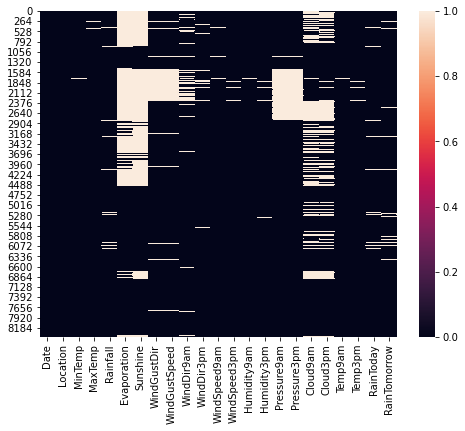

In [9]:
# Let's visualize the null values clearly
plt.figure(figsize=(8,6))
sns.heatmap(df.isnull())
plt.show()

We can clearly observe the white lines in the heat map which indicates the missing values in the dataset. We will use appropriate imputation methods to fill the null values.

In [10]:
df.skew()

MinTemp          -0.089588
MaxTemp           0.379297
Rainfall         13.028837
Evaporation      10.710605
Sunshine         -0.519717
WindGustSpeed     0.711103
WindSpeed9am      0.956250
WindSpeed3pm      0.491069
Humidity9am      -0.255843
Humidity3pm       0.117563
Pressure9am      -0.022133
Pressure3pm      -0.009385
Cloud9am         -0.309417
Cloud3pm         -0.232598
Temp9am          -0.014699
Temp3pm           0.395061
dtype: float64

# Treating null value

In [11]:
# Checking unique values in MinTemp column
df["MinTemp"].unique()

array([13.4,  7.4, 12.9,  9.2, 17.5, 14.6, 14.3,  7.7,  9.7, 13.1, 15.9,
       12.6,  8.4,  9.8, 14.1, 13.5, 11.2, 11.5, 17.1, 20.5, 15.3, 16.2,
       16.9, 20.1, 19.7, 12.5, 12. , 11.3,  9.6, 10.5, 12.3, 13.7, 16.1,
       14. , 17. , 17.3, 17.2, 17.4, 19.8, 14.9, 13.9, 18.6, 19.3, 24.4,
       18.8, 20.8, 15.7, 18.5, 20.4, 21.8, 22.3, 22. , 28. , 21.5, 21.7,
       23.5, 28.3, 18.4, 12.4, 13.3, 18. , 18.7, 15.5,  8.9, 15. , 15.4,
       16. , 12.8, 13.2, 13.8,  7.6,  8.3, 11. , 20.9, 16.4, 10. ,  8.8,
        9.3, 14.4, 10.8, 10.1,  9.1, 10.4, 12.2, 10.7,  7.8,  8.1,  7.5,
        8.2, 11.6, 13. ,  9.9,  3.5,  6.6,  7. ,  5.7,  6.2,  6. , 10.6,
        8.6,  4.5,  5.4,  2.1,  1.8,  7.2,  4.6,  4.2,  5.2,  4.1,  3.2,
        4.3,  3.7,  3.6,  6.9, 10.3,  3. ,  2.6,  5.1,  4.4,  4.7,  6.7,
        8. ,  2.2,  1.7,  2.8,  9. ,  6.3, -2. , -1.3,  2. ,  0.5,  1.2,
        0.6,  0.9,  5. ,  3.9,  3.4,  0. , -1.5, -1.7, -0.4,  0.1,  4.8,
        5.9,  2.9, -0.6, -0.3, -1. ,  0.8, -0.1,  1

The column MinTemp has numerical data and has no skewness and outliers so we can use mean method to fill the outliers.

In [12]:
# Let's check the mean of the MinTemp
df['MinTemp'].mean()  # we will replace the null values using this mean

13.193305389221573

In [13]:
# Filling missing values in MinTemp using mean
df["MinTemp"] = df["MinTemp"].fillna(df["MinTemp"].mean())

In [14]:
# Checking unique values in MaxTemp column
df["MaxTemp"].unique()

array([22.9, 25.1, 25.7, 28. , 32.3, 29.7, 25. , 26.7, 31.9, 30.1, 30.4,
       21.7, 18.6, 21. , 24.6, 27.7, 20.9, 22.5, 25.6, 29.3, 33. , 31.8,
       30.9, 32.4, 33.9, 32.7, 27.2, 24.2, 24.4, 26.5, 23.9, 28.8, 34.6,
       35.8, 37.9, 38.9, 28.3, 28.4, 30.8, 32. , 34.7, 37.7, 43. , 32.2,
       36.6, 39.9, 38.1, 34. , 35.2, 30.6, 34.3, 38.4, 38.2, 40.7, 41.5,
       42.9, 42.7, 43.1, 38.3, 36.9, 41.2, 42.2, 44.8, 40.2, 31.2, 27.3,
       21.6, 29. , 29.2, 31.3, 31.1, 29.1, 31.7, 33.2, 29.6, 32.6, 34.5,
       30.3, 22.1, 22. , 24. , 27.9, 30.2, 30.5, 25.8, 27. , 19.7, 21.9,
       25.3, 33.5, 33.6, 30. , 31.6, 22.3, 29.8, 27.6, 28.9, 29.9, 32.1,
       28.1, 21.4, 24.9, 25.4, 20. , 23.4, 22.7, 16.2, 15.8, 12.9, 11.5,
       14.5, 12.2, 16.5, 17. , 19.2, 18.9, 19.1, 18.8, 19.3, 18.4, 19. ,
       20.5, 19.5, 17.7, 18.5, 15.1, 16.3, 16.6, 16.4, 15.6, 19.8, 21.1,
       20.3, 18.1, 15.7, 16.8, 17.1, 14.3, 13.4, 17.4, 16.1, 10.5, 11.6,
       12. ,  8.8,  9.6,  8.2, 12.4, 14.9, 15.9, 14

The column MaxTemp has numerical data and has no skewness and outliers so we can use mean method to fill the outliers.

In [15]:
# Let's check the mean of the MaxTemp
df['MaxTemp'].mean()  # we will replace the null values using this mean

23.85997609085473

In [16]:
# Filling missing values in MaxTemp using mean
df["MaxTemp"] = df["MaxTemp"].fillna(df["MaxTemp"].mean())

In [17]:
# Checking unique values in Evaporation column
df["Evaporation"].unique()

array([  nan,   8.6,   3.8,   2.8,   3.2,   6.8,   4.2,   1.6,   4.4,
         4. ,   2.2,   3.4,   6.4,   4.6,   3.6,   4.8,   3. ,   1.2,
         1.4,   2.6,   1. ,   2. ,   8.4,   2.4,   0.6,   5.4,   1.8,
         7. ,   0.8,   0.2,   5.2,   5. ,   6. ,   7.6,   5.8,   5.6,
         8. ,   6.2,   6.6,   7.8,   8.8,   7.4,   9.4,   7.2,   0.4,
         0. ,  18. ,  24.2,  14.6,  19.4,  10.8,  28. ,  11.8,  24.6,
        11.2,  22.6,  10. ,  37. ,  26. ,  11. ,  19.8,  24.4,  10.6,
        27.4,  12. ,  11.6,  24. ,   9. ,  23. ,  29.2,  20.6,  13.2,
        22.8,   9.8,  16. ,  20. ,  10.4,   9.6,  12.2,  15.4,  18.4,
        24.8,  20.8,  32. ,  55.4,  17.8,  16.2,  14.2,  59.2,  33.8,
        10.2, 145. ,  16.6,  47. ,  15.2,  15.8,  12.6,  11.4,   9.2,
        14.8,  13. ,   8.2,  13.6,  12.8,  12.4,  17.6,  19.2,  13.8,
        22.4,  18.6,  13.4,  17. ,  14. ,  14.4,  15. ,  15.6,   0.7])

The column Evaporation is numerical type and has huge outliers and skewness so will replace missing values using median method.

In [18]:
# Filling null values using their median values
df["Evaporation"] = df["Evaporation"].fillna(df["Evaporation"].median())

The columns Sunshine, WindGustSpeed, WindSpeed9am, WindSpeed3pm, Humidity9am, Humidity3pm, Pressure9am, Pressure3pm, Cloud9am, Cloud3pm, Temp9am, Temp3pm  have numerical data and has no skewness and outliers so we can use mean method to fill the outliers.

In [19]:
df["Sunshine"] = df["Sunshine"].fillna(df["Sunshine"].mean())
df["WindGustSpeed"] = df["WindGustSpeed"].fillna(df["WindGustSpeed"].mean())
df["WindSpeed9am"] = df["WindSpeed9am"].fillna(df["WindSpeed9am"].mean())
df["WindSpeed3pm"] = df["WindSpeed3pm"].fillna(df["WindSpeed3pm"].mean())
df["Humidity9am"] = df["Humidity9am"].fillna(df["Humidity9am"].mean())
df["Humidity3pm"] = df["Humidity3pm"].fillna(df["Humidity3pm"].mean())
df["Pressure9am"] = df["Pressure9am"].fillna(df["Pressure9am"].mean())
df["Pressure3pm"] = df["Pressure3pm"].fillna(df["Pressure3pm"].mean())
df["Cloud9am"] = df["Cloud9am"].fillna(df["Cloud9am"].mean())
df["Cloud3pm"] = df["Cloud3pm"].fillna(df["Cloud3pm"].mean())
df["Temp9am"] = df["Temp9am"].fillna(df["Temp9am"].mean())
df["Temp3pm"] = df["Temp3pm"].fillna(df["Temp3pm"].mean())

The features WindGustDir, WindDir9am, WindDir3pm and RainToday have categorical data so we can fill the null values using mode method.

In [20]:
df["WindGustDir"] = df["WindGustDir"].fillna(df["WindGustDir"].mode()[0])
df["WindDir9am"] = df["WindDir9am"].fillna(df["WindDir9am"].mode()[0])
df["WindDir3pm"] = df["WindDir3pm"].fillna(df["WindDir3pm"].mode()[0])
df["RainToday"] = df["RainToday"].fillna(df["RainToday"].mode()[0])

The column Rainfall is numerical type and has huge outliers and skewness so will replace missing values using median method.

In [21]:
# Let's check the  null values if there any
df.isnull().sum()

Date               0
Location           0
MinTemp            0
MaxTemp            0
Rainfall         240
Evaporation        0
Sunshine           0
WindGustDir        0
WindGustSpeed      0
WindDir9am         0
WindDir3pm         0
WindSpeed9am       0
WindSpeed3pm       0
Humidity9am        0
Humidity3pm        0
Pressure9am        0
Pressure3pm        0
Cloud9am           0
Cloud3pm           0
Temp9am            0
Temp3pm            0
RainToday          0
RainTomorrow     239
dtype: int64

Since RainTomorrow and Rainfall are our target columns and they are the only columns left with null values, we will not use imputation on them. We will drop the null values here.

In [22]:
df.dropna(inplace=True)

In [24]:
# again checking for null values
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

Now we have removed the null values using imputaion methods and the data is now clean. So we can move further.

<AxesSubplot:>

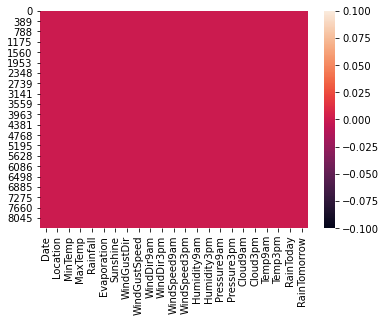

In [25]:
# Let's visualize the null values clearly
sns.heatmap(df.isnull())

So it is clear that there are no missing values.

In [26]:
# Checking how many columns are there in the dataset
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

These are the columns present in the dataset.

# Feature Engineering

First we will convert Date column from object type to datetime and then we will extract Day, Month and Year from Date column

In [29]:
# Converting Date  column from object type to Datetime Type
df['Date']=pd.to_datetime(df['Date'])

In [30]:
df.dtypes

Date             datetime64[ns]
Location                 object
MinTemp                 float64
MaxTemp                 float64
Rainfall                float64
Evaporation             float64
Sunshine                float64
WindGustDir              object
WindGustSpeed           float64
WindDir9am               object
WindDir3pm               object
WindSpeed9am            float64
WindSpeed3pm            float64
Humidity9am             float64
Humidity3pm             float64
Pressure9am             float64
Pressure3pm             float64
Cloud9am                float64
Cloud3pm                float64
Temp9am                 float64
Temp3pm                 float64
RainToday                object
RainTomorrow             object
dtype: object

We have converted Date column data type from object to datetime type.

In [31]:
# Extracting Day from Date column
df["Day"] = df["Date"].dt.day

# Extracting Month from Date column
df["Month"] = df["Date"].dt.month

# Extracting Year from Date column
df["Year"] = df["Date"].dt.year

Now we have extracted Day, Month and Year from Date column so we can drop this column as it is of no use.

In [32]:
# Dropping Date column
df.drop("Date",axis=1,inplace=True)

In [33]:
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,22.9,0.6,4.6,7.632205,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,No,1,12,2008
1,Albury,7.4,25.1,0.0,4.6,7.632205,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,No,2,12,2008
2,Albury,12.9,25.7,0.0,4.6,7.632205,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,No,3,12,2008
3,Albury,9.2,28.0,0.0,4.6,7.632205,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,No,4,12,2008
4,Albury,17.5,32.3,1.0,4.6,7.632205,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No,5,12,2008


We have extracted Day, Month and Year from Date column and dropped Date the column.

By some observation we can notice that the dataset is orderly arranged by "Date" column so we will shuffle the dataset to avoid the problem while building the models and to get better results.

In [34]:
#lets shuffle the dataset
df = shuffle(df)
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
7548,PerthAirport,8.100000,15.8,32.2,3.8,4.100000,WSW,81.000000,WSW,WSW,19.0,37.0,64.0,62.0,1006.800000,1009.800000,7.000000,7.000000,12.3,15.0,Yes,Yes,4,9,2012
4165,Williamtown,18.400000,29.5,0.0,4.6,7.632205,ENE,54.000000,NE,ENE,17.0,31.0,62.0,46.0,1020.900000,1017.800000,4.566622,4.503183,25.0,28.0,No,No,22,2,2017
2863,Williamtown,16.800000,28.0,0.0,24.6,12.700000,ENE,39.000000,SW,ESE,19.0,22.0,74.0,60.0,1012.400000,1008.900000,4.000000,1.000000,22.1,25.4,No,No,30,11,2015
4075,Williamtown,15.200000,22.3,1.4,8.0,7.632205,SSE,48.000000,WSW,SSE,20.0,28.0,41.0,52.0,1012.500000,1012.600000,4.566622,4.503183,19.4,20.2,Yes,No,24,11,2016
2666,Penrith,15.400000,23.6,1.2,4.6,7.632205,NE,19.000000,SSE,NNE,4.0,7.0,87.0,45.0,1017.640233,1015.236075,4.566622,4.503183,17.6,23.0,Yes,No,11,4,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1722,Newcastle,13.193305,25.3,0.0,4.6,7.632205,N,40.174469,NE,SE,4.0,19.0,59.0,49.0,1017.640233,1015.236075,5.000000,2.000000,21.6,24.0,No,No,30,12,2013
3713,Williamtown,15.200000,24.6,0.0,4.6,7.632205,E,54.000000,E,E,19.0,37.0,76.0,56.0,1016.000000,1015.400000,7.000000,8.000000,21.0,23.6,No,No,28,11,2015
4928,Melbourne,8.900000,23.4,0.0,3.2,11.900000,SW,35.000000,N,SSW,15.0,11.0,54.0,39.0,1017.800000,1014.500000,1.000000,2.000000,15.5,21.4,No,No,17,11,2010
4180,Williamtown,16.800000,25.1,3.2,4.6,7.632205,S,50.000000,NW,S,13.0,24.0,87.0,52.0,1015.500000,1014.400000,8.000000,8.000000,19.4,24.0,Yes,Yes,9,3,2017


In [37]:
# Checking the list of counts of target columns
df['RainTomorrow'].value_counts()

No     6155
Yes    1924
Name: RainTomorrow, dtype: int64

In [38]:
df['Rainfall'].value_counts()

0.0     5234
0.2      404
0.4      177
0.6      112
1.4       84
        ... 
6.3        1
28.0       1
31.2       1
30.6       1
49.6       1
Name: Rainfall, Length: 250, dtype: int64

These are the value counts of the target columns.

# Description of Dataset

In [39]:
# Statistical summary of dataset
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
count,8079.000000,8079.000000,8079.000000,8079.000000,8079.000000,8079.000000,8079.000000,8079.000000,8079.000000,8079.000000,8079.000000,8079.000000,8079.000000,8079.000000,8079.000000,8079.000000,8079.000000,8079.000000,8079.000000
mean,13.145127,23.855383,2.802451,5.085815,7.672996,39.991196,13.742237,18.417291,67.743979,51.209801,1017.717700,1015.298600,4.534538,4.486032,17.757290,22.443493,15.756653,6.377398,2012.084664
std,5.412352,6.104662,10.485324,3.918693,2.808423,13.755847,10.133653,9.718200,16.831239,18.364607,6.262573,6.193264,2.455248,2.321585,5.611654,5.933848,8.794239,3.404269,2.477082
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000,1.000000,1.000000,2008.000000
25%,9.200000,19.300000,0.000000,4.000000,7.632205,31.000000,6.000000,11.000000,56.000000,39.000000,1014.100000,1011.500000,3.000000,3.000000,13.800000,18.100000,8.000000,3.000000,2010.000000
50%,13.200000,23.300000,0.000000,4.600000,7.632205,40.174469,13.000000,19.000000,68.000000,51.000000,1017.640233,1015.236075,4.566622,4.503183,17.762015,21.900000,16.000000,6.000000,2011.000000
75%,17.300000,28.000000,1.000000,5.200000,9.000000,48.000000,20.000000,24.000000,80.000000,63.000000,1021.400000,1018.900000,7.000000,7.000000,21.900000,26.300000,23.000000,9.000000,2014.000000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,61.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000,31.000000,12.000000,2017.000000


This gives the statistical information of the dataset. The summary of this dataset looks perfect since there is no invalid values present

From the above description we can observe the following things.

1. The counts of columns are same which means there are no missing values present in the dataset.

2. Some columns like Rainfall, Evaporation, Temp3pm have mean value a bit greater than the median(50%) which means they are skewed to right.

3. Some columns like WindSpeed3pm, Humidity9am have median value a bit greater than the mean value hence they are skewed to left.

4. Also the columns like MinTemp, MaxTemp, Sunshine, WindGustSpeed, WindSpeed9am, Humidity3pm, Pressure9am, Pressure3pm, Cloud9am, Cloud3pm, Temp9am have almost same mean and median values that means the data is normal and symmetric also they have no skewness.

Before visualizing the data, let's Separate categorical and numerical columns

In [40]:
# checking for categorical columns
categorical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorical_col.append(i)
print(categorical_col)

['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


These are the categorical columns in the given datatset.

In [41]:
# Now checking for numerical columns
numerical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        numerical_col.append(i)
print(numerical_col)

['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'Day', 'Month', 'Year']


These are the numerical columns in the dataset.

# Data Visualization

# Plotting categorical columns

Melbourne       1442
PerthAirport    1204
Williamtown     1136
Albury           889
Newcastle        804
CoffsHarbour     609
Brisbane         569
Penrith          476
Wollongong       464
Darwin           250
Adelaide         198
Uluru             38
Name: Location, dtype: int64


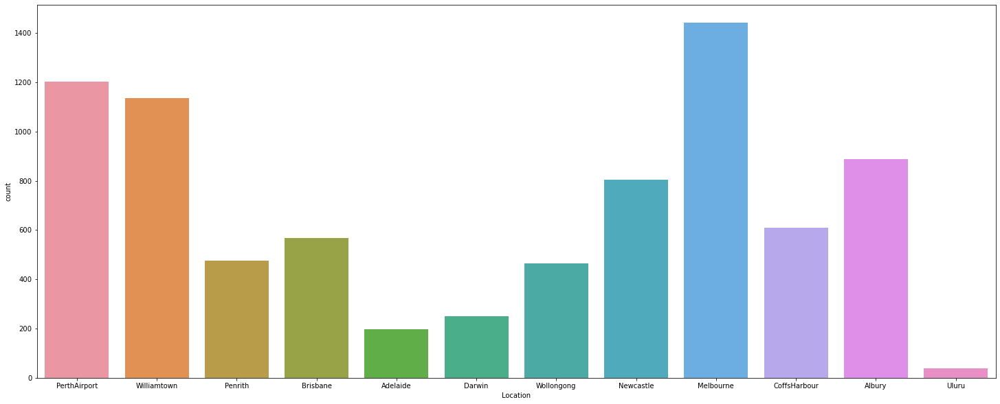

In [42]:
# Visualizing the types of fuel in Location
print(df["Location"].value_counts())
plt.figure(figsize=(25,10),)
sns.countplot(df["Location"])
plt.show()

The count plot shows the Location used for weather forecasting. Here most of the data is collected from Melbourne and teh least is collected from Uluru.

N      1619
E       550
SW      548
SSE     541
S       535
WNW     511
W       487
WSW     481
SE      469
ENE     397
SSW     381
NW      368
NE      346
NNE     335
ESE     298
NNW     213
Name: WindGustDir, dtype: int64


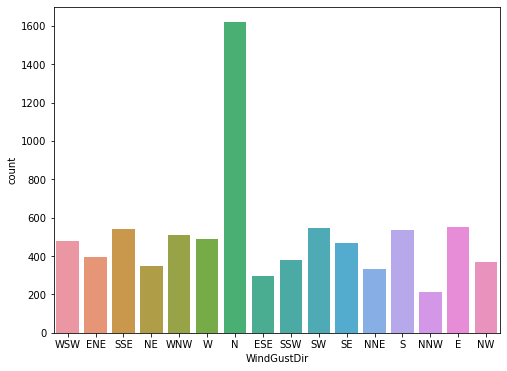

In [43]:
# Visualizing the counts of other fuel
print(df["WindGustDir"].value_counts())
plt.figure(figsize=(8,6))
sns.countplot(df["WindGustDir"])
plt.show()

The count plot shows the WindGustDir used for weather forecasting. Here most of the data is N direction.

N      1645
SW      676
NW      601
WSW     509
SE      491
WNW     462
SSW     451
ENE     426
NNE     417
NE      396
W       396
S       379
E       371
SSE     353
NNW     260
ESE     246
Name: WindDir9am, dtype: int64


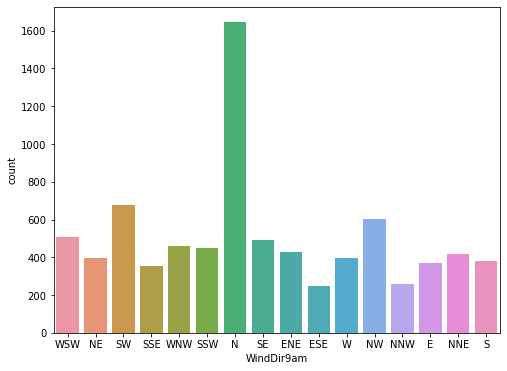

In [44]:
# Visualizing the counts of WindDir9am
print(df["WindDir9am"].value_counts())
plt.figure(figsize=(8,6))
sns.countplot(df["WindDir9am"])
plt.show()

The count plot shows the WindDir9am used for weather forecasting. Here most of the data is N direction.

SE     1076
S       679
SSE     600
WSW     559
NE      539
N       505
SW      473
WNW     467
NW      459
ESE     450
W       447
E       438
ENE     391
NNE     356
SSW     352
NNW     288
Name: WindDir3pm, dtype: int64


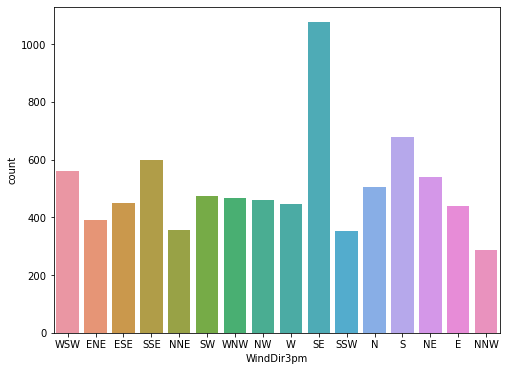

In [45]:
# Visualizing the counts of WindDir3pm
print(df["WindDir3pm"].value_counts())
plt.figure(figsize=(8,6))
sns.countplot(df["WindDir3pm"])
plt.show()

The count plot shows the WindDir3am used for weather forecasting. Here most of the data is SE direction.

No     6120
Yes    1959
Name: RainToday, dtype: int64


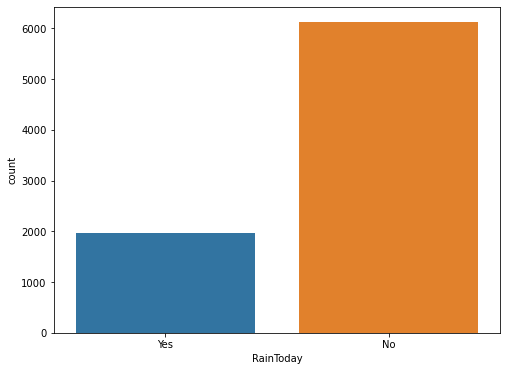

In [46]:
# Visualizing the counts of RainToday
print(df["RainToday"].value_counts())
plt.figure(figsize=(8,6))
sns.countplot(df["RainToday"])
plt.show()

Here as we can see the count of No is high compare to Yes.

No     6155
Yes    1924
Name: RainTomorrow, dtype: int64


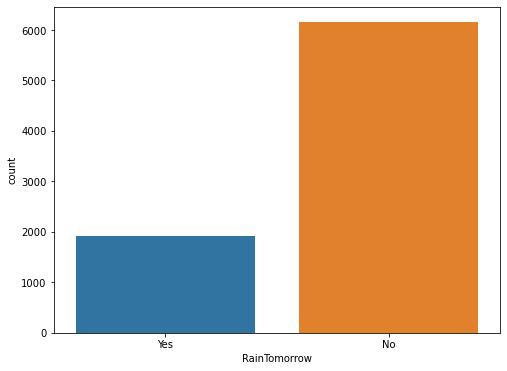

In [47]:
# Visualizing the counts of RainTomorrow
print(df["RainTomorrow"].value_counts())
plt.figure(figsize=(8,6))
sns.countplot(df["RainTomorrow"])
plt.show()

This is our target column.

From the count plot we can observe that the count of "No RainTomorrow" is high compared to the count of "Yes RainTommorow". That is there are more number of No RainTomorrow than Yes RainTomorrow. This leads to class imbalance issue in the data, we will rectify it by using oversampling method in later part.

# Distribution of skewness

# Plotting numerical columns

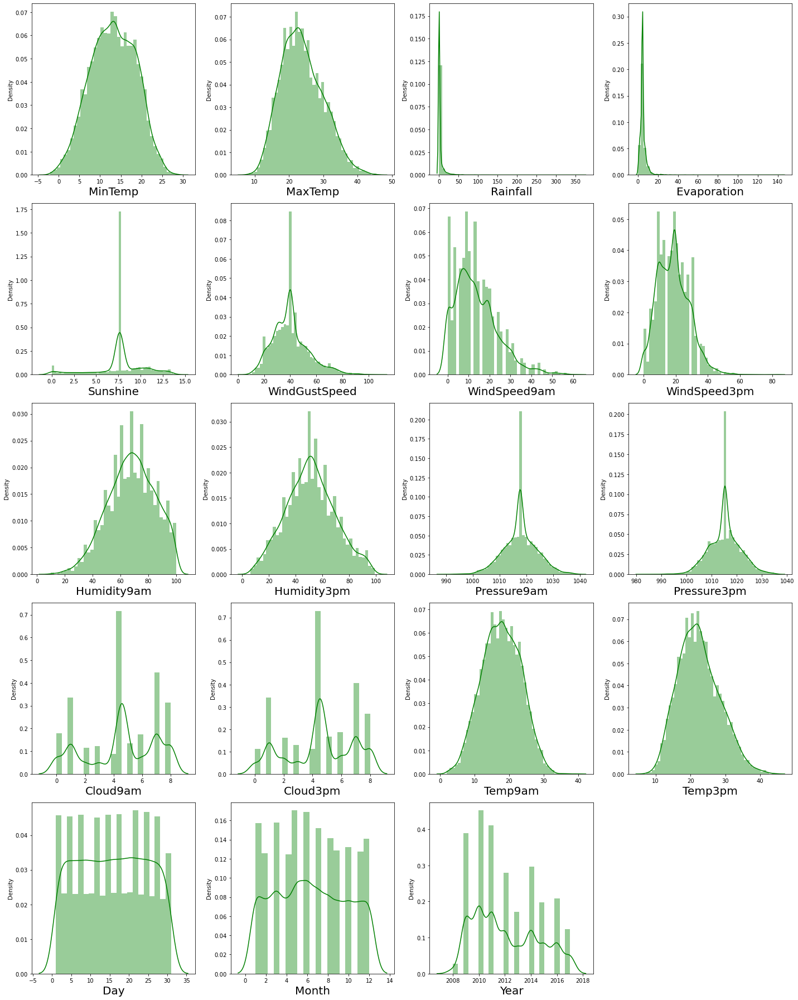

In [48]:
# Checking how the data has been distriubted in each column

plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1
for column in numerical_col:
    if plotnumber<=20:
        ax=plt.subplot(5,4,plotnumber)
        sns.distplot(df[column],color="g")
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()

From the above distribution plots we can observe that the data is not normally distributed in all the columns

In some of the columns the mean is greater than the median which means they are skewed to right.

In some of the columns the median is greater than the mean which means they are skewed to left.

We will remove these skewness in all the columns in the later part.

# Comparing target variables with features.

<Figure size 3600x720 with 0 Axes>

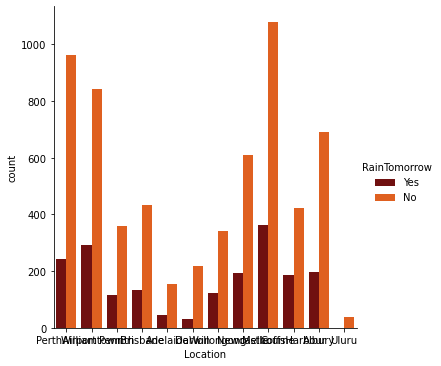

In [50]:
# Checking RainTomorrow in Location
plt.figure(figsize=(50,10))
sns.catplot(x='Location',hue='RainTomorrow',palette="gist_heat",kind="count",data=df)
plt.show()

The RainTomorrow is minimum for Melbourne location

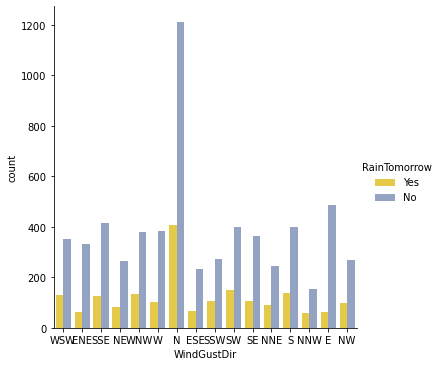

In [52]:
# Checking RainTomorrow in WindGustDir
sns.catplot(x='WindGustDir',hue='RainTomorrow',palette="Set2_r",kind="count",data=df)
plt.show()

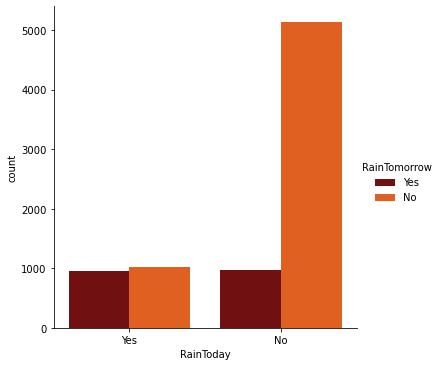

In [53]:
# Checking RainTomorrow in RainToday
sns.catplot(x='RainToday',hue='RainTomorrow',palette="gist_heat",kind="count",data=df)
plt.show()

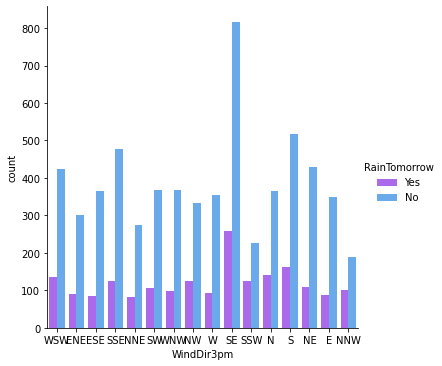

In [54]:
# Checking RainTomorrow in WindDir3pm
sns.catplot(x='WindDir3pm',hue='RainTomorrow',palette="cool_r",kind="count",data=df)
plt.show()

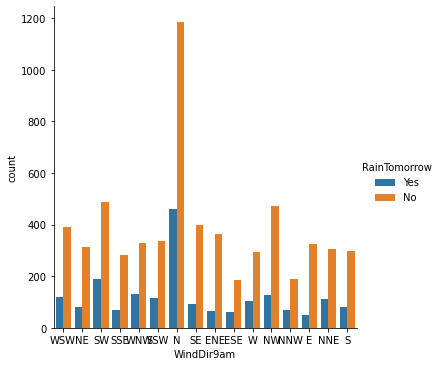

In [55]:
# Checking RainTomorrow in WindDir9am
sns.catplot(x='WindDir9am',hue='RainTomorrow',kind="count",data=df)
plt.show()

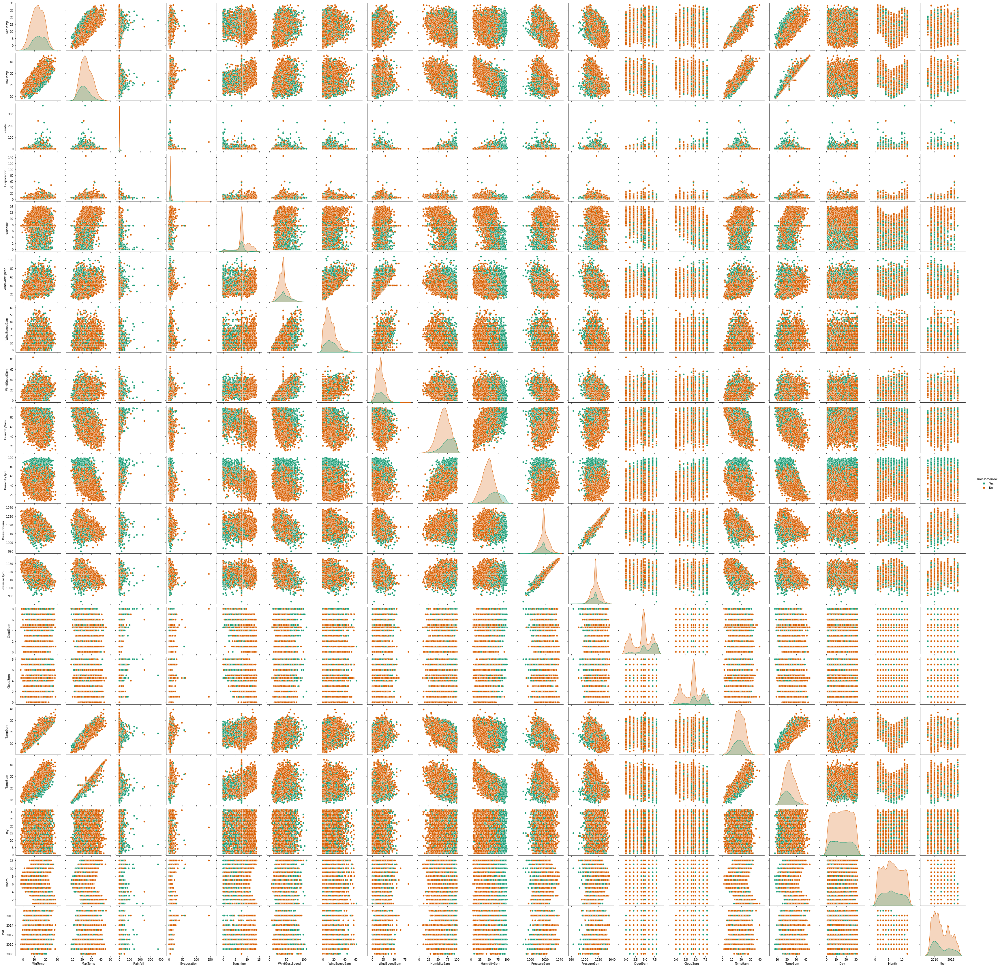

In [57]:
# Checking the pairwise relation between the features and label RainTomorrow.
sns.pairplot(df,hue="RainTomorrow",palette="Dark2")
plt.show()

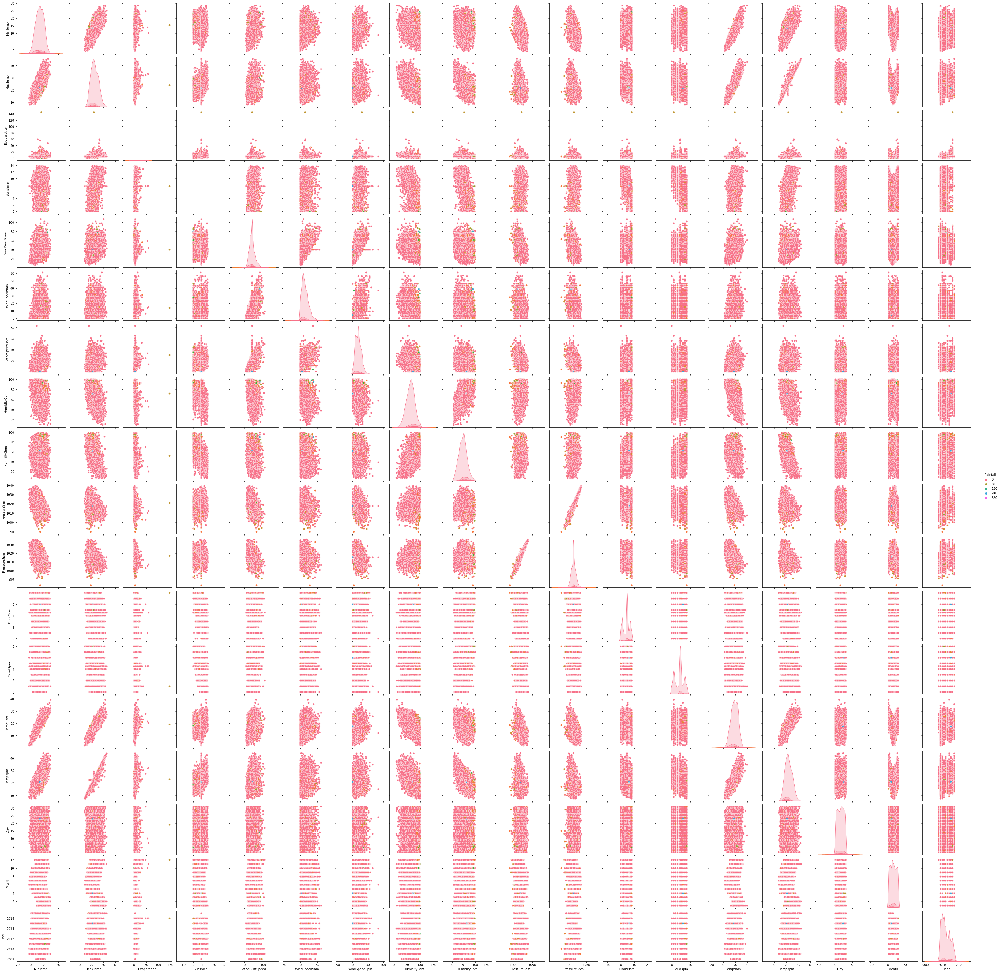

In [59]:
# Checking the pairwise relation between the features and label Rainfall.
sns.pairplot(df,hue="Rainfall",palette="husl")
plt.show()

The pairplot gives the pairwise relation between the features on the basis of the target "RainTomorrow" and "Rainfall".Here we can observe the relation between the features and labels.

Most of the features have strong linear relationship and correlation with each other.

From the plot we can also observe the outliers in some of the columns and on the diagonal we can notice the distribution plot.

# Identifying the outliers

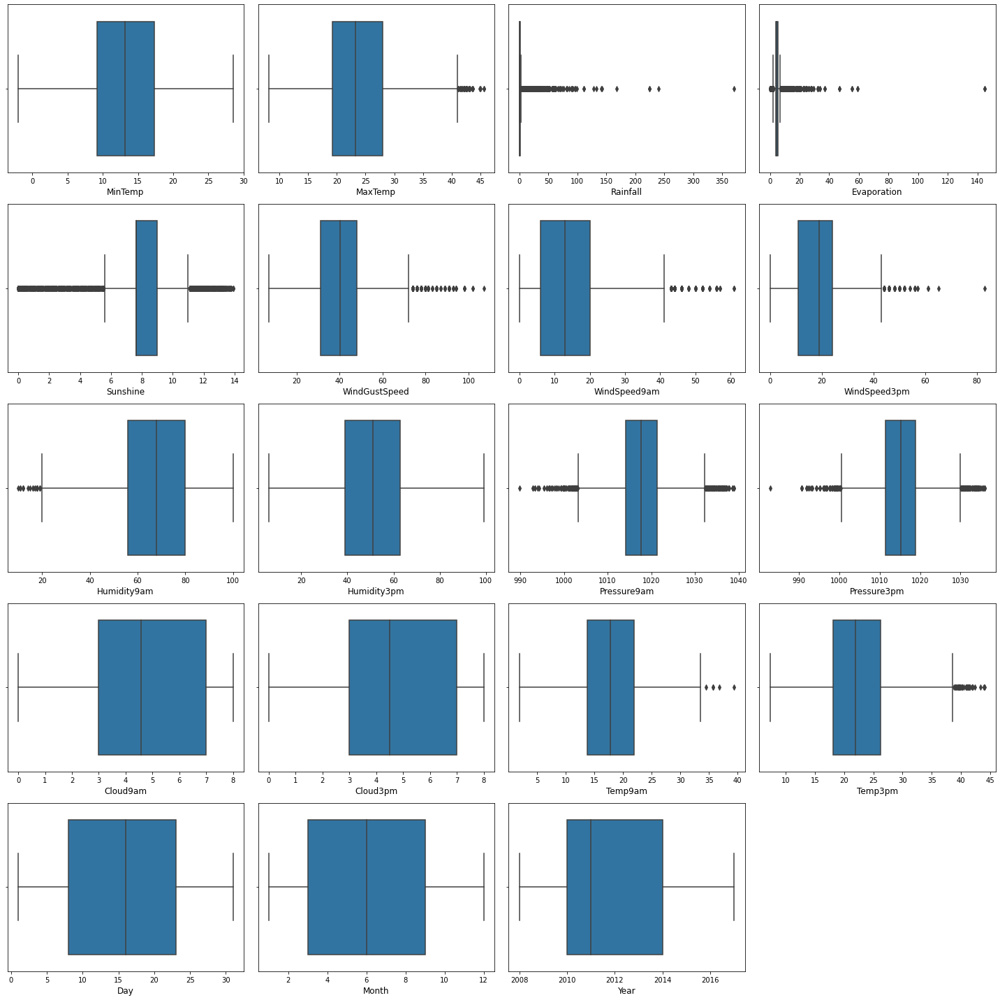

In [60]:
# Identifying the outlierspresent in numerical columns using boxplot

plt.figure(figsize=(20,20),facecolor='white')
plotnumber=1
for column in numerical_col:
    if plotnumber<=20:
        ax=plt.subplot(5,4,plotnumber)
        sns.boxplot(df[column])
        plt.xlabel(column,fontsize=12)
    plotnumber+=1
plt.tight_layout()

In the boxplot we can notice the outliers present in most of the columns.Let's remove outliers using Zscore method.

# Removing outliers

# 1. Zscore method

In [61]:
# Features containing outliers
features = df[['MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm','Humidity9am', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']]

In [62]:
# Using zscore to remove outliers
from scipy.stats import zscore

z=np.abs(zscore(features))

z

array([[1.31962774, 2.80385878, 0.32814379, ..., 0.8878905 , 0.97255246,
        1.25449003],
       [0.92469758, 0.26729018, 0.12398144, ..., 0.40391533, 1.29073501,
        0.93646671],
       [0.67896853, 0.26729018, 4.98007745, ..., 1.03321865, 0.77392134,
        0.49827536],
       ...,
       [0.07460055, 0.26729018, 0.48126556, ..., 0.12895457, 0.4022753 ,
        0.17586517],
       [0.20389237, 0.03791717, 0.12398144, ..., 0.14510215, 0.29274998,
        0.26232617],
       [0.68073221, 0.26729018, 0.12398144, ..., 0.95293281, 1.5962931 ,
        0.63091004]])

In [63]:
# Creating new dataframe
new_df = df[(z<3).all(axis=1)] 
new_df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
7548,PerthAirport,8.100000,15.8,32.2,3.8,4.100000,WSW,81.000000,WSW,WSW,19.0,37.0,64.0,62.0,1006.800000,1009.800000,7.000000,7.000000,12.3,15.0,Yes,Yes,4,9,2012
4165,Williamtown,18.400000,29.5,0.0,4.6,7.632205,ENE,54.000000,NE,ENE,17.0,31.0,62.0,46.0,1020.900000,1017.800000,4.566622,4.503183,25.0,28.0,No,No,22,2,2017
4075,Williamtown,15.200000,22.3,1.4,8.0,7.632205,SSE,48.000000,WSW,SSE,20.0,28.0,41.0,52.0,1012.500000,1012.600000,4.566622,4.503183,19.4,20.2,Yes,No,24,11,2016
2666,Penrith,15.400000,23.6,1.2,4.6,7.632205,NE,19.000000,SSE,NNE,4.0,7.0,87.0,45.0,1017.640233,1015.236075,4.566622,4.503183,17.6,23.0,Yes,No,11,4,2015
4284,Williamtown,9.200000,19.0,0.2,4.6,7.632205,WNW,30.000000,WNW,SW,22.0,17.0,100.0,66.0,1025.200000,1024.300000,4.000000,4.503183,11.0,18.5,No,No,21,6,2017
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1722,Newcastle,13.193305,25.3,0.0,4.6,7.632205,N,40.174469,NE,SE,4.0,19.0,59.0,49.0,1017.640233,1015.236075,5.000000,2.000000,21.6,24.0,No,No,30,12,2013
3713,Williamtown,15.200000,24.6,0.0,4.6,7.632205,E,54.000000,E,E,19.0,37.0,76.0,56.0,1016.000000,1015.400000,7.000000,8.000000,21.0,23.6,No,No,28,11,2015
4928,Melbourne,8.900000,23.4,0.0,3.2,11.900000,SW,35.000000,N,SSW,15.0,11.0,54.0,39.0,1017.800000,1014.500000,1.000000,2.000000,15.5,21.4,No,No,17,11,2010
4180,Williamtown,16.800000,25.1,3.2,4.6,7.632205,S,50.000000,NW,S,13.0,24.0,87.0,52.0,1015.500000,1014.400000,8.000000,8.000000,19.4,24.0,Yes,Yes,9,3,2017


This is the new dataframe after removing the outliers. Here we have removed the outliers whose Zscore is less than 3.

In [64]:
# Shape of original dataset
df.shape

(8079, 25)

In [65]:
# Shape of new dataframe
new_df.shape

(7659, 25)

In [66]:
# Checking the the data loss
data_loss = (8079-7659)/8079*100
data_loss

5.1986632008911995

Here the data loss is 5.19% which is less than 10% and feasible.

# 2. IQR (Inter Quantile Range) method

In [67]:
# 1st quantile
Q1=features.quantile(0.25)

# 3rd quantile
Q3=features.quantile(0.75)

# IQR
IQR=Q3 - Q1

df2=df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]

In [68]:
df2.shape

(3913, 25)

In [69]:
# Let's check the dataloss
data_loss = (8079-3913)/8079*100
data_loss

51.56578784503033

Here the data loss is 51.56% which is very high. so considering Z score method for outliers removal.

# Encoding the categorical columns using Label Encoding

In [70]:
categorical_col = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']

In [71]:
from sklearn.preprocessing import LabelEncoder
LE=LabelEncoder()
new_df[categorical_col]= new_df[categorical_col].apply(LE.fit_transform)

In [72]:
new_df[categorical_col]

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
7548,8,15,15,15,1,1
4165,10,1,4,1,0,0
4075,10,10,15,10,1,0
2666,7,4,10,5,1,0
4284,10,14,14,12,0,0
...,...,...,...,...,...,...
1722,6,3,4,9,0,0
3713,10,0,0,0,0,0
4928,5,12,3,11,0,0
4180,10,8,7,8,1,1


I have encoded the categorical columns using label encoding method.

# Correlation between the target variable and features using HEAT map

In [73]:
# Checking the correlation between features and the target
cor = new_df.corr()
cor

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
Location,1.000000,0.109292,0.053749,0.017681,0.114015,0.048041,-0.036273,0.249208,-0.045656,-0.025025,0.244793,0.233975,0.000313,0.058457,-0.016181,-0.002016,0.033647,0.025803,0.108619,0.050876,0.006121,0.010893,-0.007391,-0.108688,0.473245
MinTemp,0.109292,1.000000,0.718673,0.095790,0.386690,0.060710,-0.157903,0.232434,-0.046754,-0.156042,0.148148,0.188636,-0.127384,0.094762,-0.431403,-0.425734,0.086365,0.037339,0.889772,0.687257,0.068398,0.099295,0.008868,-0.265408,0.024738
MaxTemp,0.053749,0.718673,1.000000,-0.138898,0.479873,0.384056,-0.236480,0.139353,-0.220373,-0.188449,0.017371,0.098821,-0.384406,-0.407936,-0.330596,-0.409669,-0.258607,-0.251567,0.863716,0.974941,-0.222793,-0.148492,0.013246,-0.179432,0.105829
Rainfall,0.017681,0.095790,-0.138898,1.000000,-0.099644,-0.172204,0.083093,0.091630,0.123893,0.075726,0.056023,0.035137,0.300544,0.298589,-0.106105,-0.044102,0.225883,0.190880,-0.031036,-0.148317,0.694967,0.281332,-0.018240,-0.000174,0.005674
Evaporation,0.114015,0.386690,0.479873,-0.099644,1.000000,0.379093,-0.108687,0.225222,-0.100790,-0.034330,0.201689,0.151184,-0.371073,-0.251643,-0.262123,-0.276713,-0.141666,-0.169274,0.459426,0.463870,-0.171319,-0.092889,0.006148,-0.044544,0.081933
Sunshine,0.048041,0.060710,0.384056,-0.172204,0.379093,1.000000,-0.104630,0.013983,-0.077304,-0.065832,0.002808,0.051154,-0.368886,-0.438846,-0.007278,-0.067275,-0.537415,-0.554448,0.257906,0.401151,-0.227317,-0.334041,-0.005099,0.005814,0.051063
WindGustDir,-0.036273,-0.157903,-0.236480,0.083093,-0.108687,-0.104630,1.000000,-0.000043,0.404081,0.506608,0.045250,0.106066,0.028574,0.049291,-0.094300,-0.009221,0.126267,0.095006,-0.183053,-0.247931,0.125202,0.044881,0.018211,0.039638,-0.095376
WindGustSpeed,0.249208,0.232434,0.139353,0.091630,0.225222,0.013983,-0.000043,1.000000,-0.076735,0.073608,0.576859,0.626747,-0.269820,-0.085096,-0.370859,-0.331826,0.009915,0.063592,0.202185,0.104505,0.083120,0.181663,-0.002616,0.038499,-0.038843
WindDir9am,-0.045656,-0.046754,-0.220373,0.123893,-0.100790,-0.077304,0.404081,-0.076735,1.000000,0.242424,0.081530,0.052343,0.007811,0.120752,-0.002379,0.081293,0.090185,0.063955,-0.101782,-0.227870,0.152114,0.024969,-0.010669,0.018811,-0.039169
WindDir3pm,-0.025025,-0.156042,-0.188449,0.075726,-0.034330,-0.065832,0.506608,0.073608,0.242424,1.000000,0.038143,0.077168,-0.010240,-0.011005,-0.130338,-0.038174,0.076632,0.055080,-0.170193,-0.199034,0.101252,0.004563,0.000701,0.035070,-0.004041


This gives the correlation between the dependent and independent variables. We can visualize this by plotting heat map.

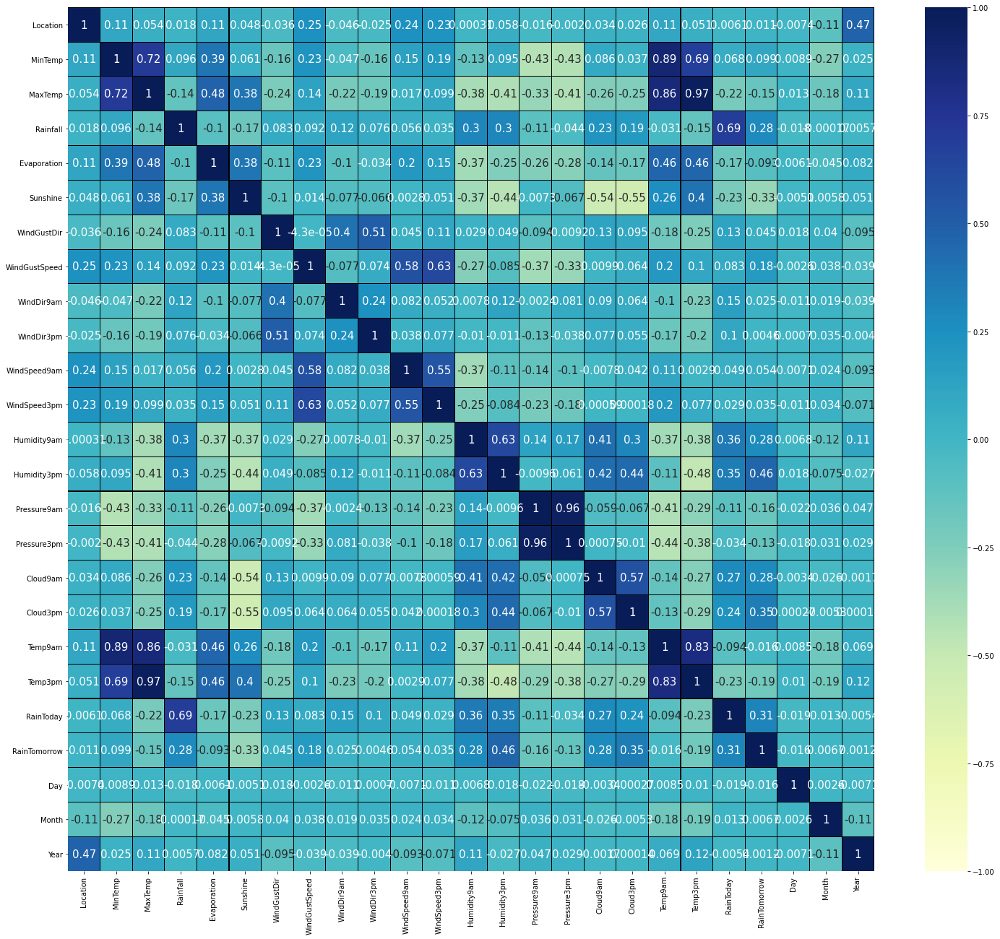

In [74]:
# Visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(25,22))
sns.heatmap(new_df.corr(),linewidths=.1,vmin=-1, vmax=1, fmt='.2g', annot = True, linecolor="black",annot_kws={'size':15},cmap="YlGnBu")
plt.yticks(rotation=0);

# Visualizing the correlation between RainTomorrow and features using bar plot

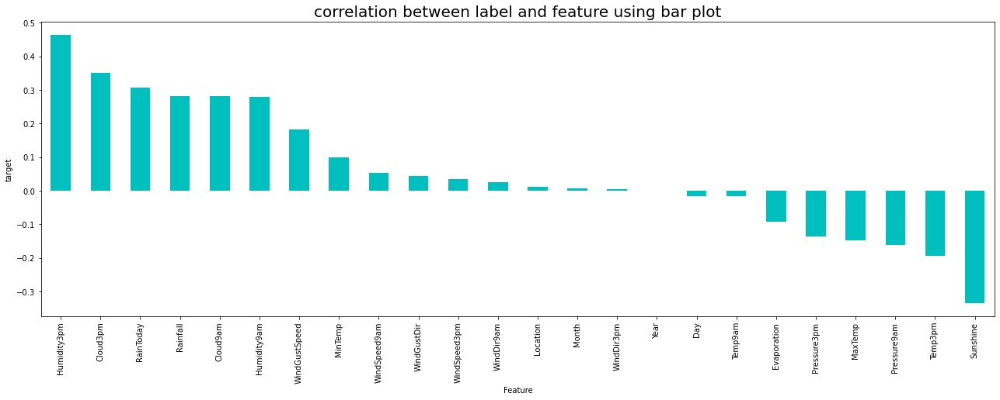

In [75]:
plt.figure(figsize=(22,7))
new_df.corr()['RainTomorrow'].sort_values(ascending=False).drop(['RainTomorrow']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=10)
plt.ylabel('target',fontsize=10)
plt.title('correlation between label and feature using bar plot',fontsize=20)
plt.show()

This is the bar plot to check the correlation between RainTomorrow and features. Here we can easily notice the positive and negative correlation between the features and the label.

# Visualizing the correlation between RainFall and features using bar plot

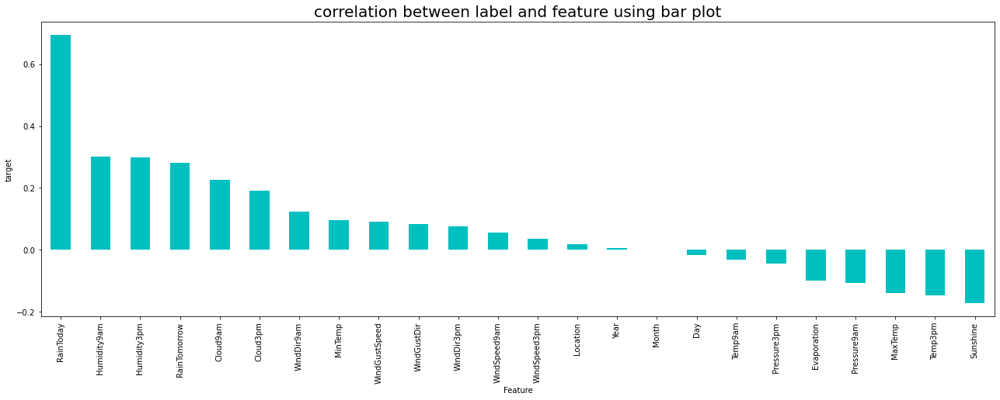

In [76]:
plt.figure(figsize=(22,7))
new_df.corr()['Rainfall'].sort_values(ascending=False).drop(['Rainfall']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=10)
plt.ylabel('target',fontsize=10)
plt.title('correlation between label and feature using bar plot',fontsize=20)
plt.show()

This is the bar plot to check the correlation between Rainfall and features. Here we can easily notice the positive and negative correlation between the features and the label.

From both the bar plots we can observe that the columns Year, Month, Day have very less correlation with both the labels Raintomorrow and Rainfall. Let's drop those columns.

In [77]:
# Dropping irrelevant columns
new_df.drop("Year",axis=1,inplace=True)
new_df.drop("Month",axis=1,inplace=True)
new_df.drop("Day",axis=1,inplace=True)

In [78]:
new_df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
7548,8,8.1,15.8,32.2,3.8,4.100000,15,81.0,15,15,19.0,37.0,64.0,62.0,1006.800000,1009.800000,7.000000,7.000000,12.3,15.0,1,1
4165,10,18.4,29.5,0.0,4.6,7.632205,1,54.0,4,1,17.0,31.0,62.0,46.0,1020.900000,1017.800000,4.566622,4.503183,25.0,28.0,0,0
4075,10,15.2,22.3,1.4,8.0,7.632205,10,48.0,15,10,20.0,28.0,41.0,52.0,1012.500000,1012.600000,4.566622,4.503183,19.4,20.2,1,0
2666,7,15.4,23.6,1.2,4.6,7.632205,4,19.0,10,5,4.0,7.0,87.0,45.0,1017.640233,1015.236075,4.566622,4.503183,17.6,23.0,1,0
4284,10,9.2,19.0,0.2,4.6,7.632205,14,30.0,14,12,22.0,17.0,100.0,66.0,1025.200000,1024.300000,4.000000,4.503183,11.0,18.5,0,0


This is the dataframe after removing irrelevant columns.

# Part (a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

# Separating the features and label variables into x and y

In [79]:
x = new_df.drop("RainTomorrow", axis=1)
y = new_df["RainTomorrow"]

In [80]:
# Dimension of x
x.shape

(7659, 21)

In [81]:
# Dimension of y
y.shape

(7659,)

# Checking for skewness

In [82]:
# Checking the skewness
x.skew().sort_values(ascending=False)

Rainfall         3.486019
Evaporation      1.282918
RainToday        1.259585
WindSpeed9am     0.720106
WindGustSpeed    0.523174
Temp3pm          0.331266
MaxTemp          0.316888
WindSpeed3pm     0.309801
WindDir9am       0.159135
Humidity3pm      0.128530
WindGustDir      0.115677
Pressure3pm      0.063423
Pressure9am      0.032112
Temp9am         -0.038058
Location        -0.040806
MinTemp         -0.069722
WindDir3pm      -0.118308
Humidity9am     -0.228562
Cloud3pm        -0.257514
Cloud9am        -0.339484
Sunshine        -0.724567
dtype: float64

In [83]:
#We can see skewness in few of our columns, we will remove the skewness using power_transform function
from sklearn.preprocessing import power_transform
x_new = power_transform(x)
x=pd.DataFrame(x_new,columns=x.columns)
x.skew().sort_values(ascending=False) #validating that the skewness is removed

RainToday        1.259585
Rainfall         1.011326
Evaporation      0.059720
WindGustSpeed    0.003388
Pressure9am     -0.000314
Pressure3pm     -0.000653
Temp3pm         -0.013227
MaxTemp         -0.014382
Humidity3pm     -0.037170
Temp9am         -0.056073
Sunshine        -0.057076
Humidity9am     -0.065638
WindSpeed3pm    -0.076829
MinTemp         -0.102529
WindSpeed9am    -0.114098
WindDir9am      -0.161443
Location        -0.187233
WindGustDir     -0.190316
Cloud3pm        -0.223396
WindDir3pm      -0.246753
Cloud9am        -0.284731
dtype: float64

We have removed the skewness in all the columns except RainToday and Rainfall. This is because these columns may have some extreme test level. So keeping the skewness in those columns as it is and moving further.

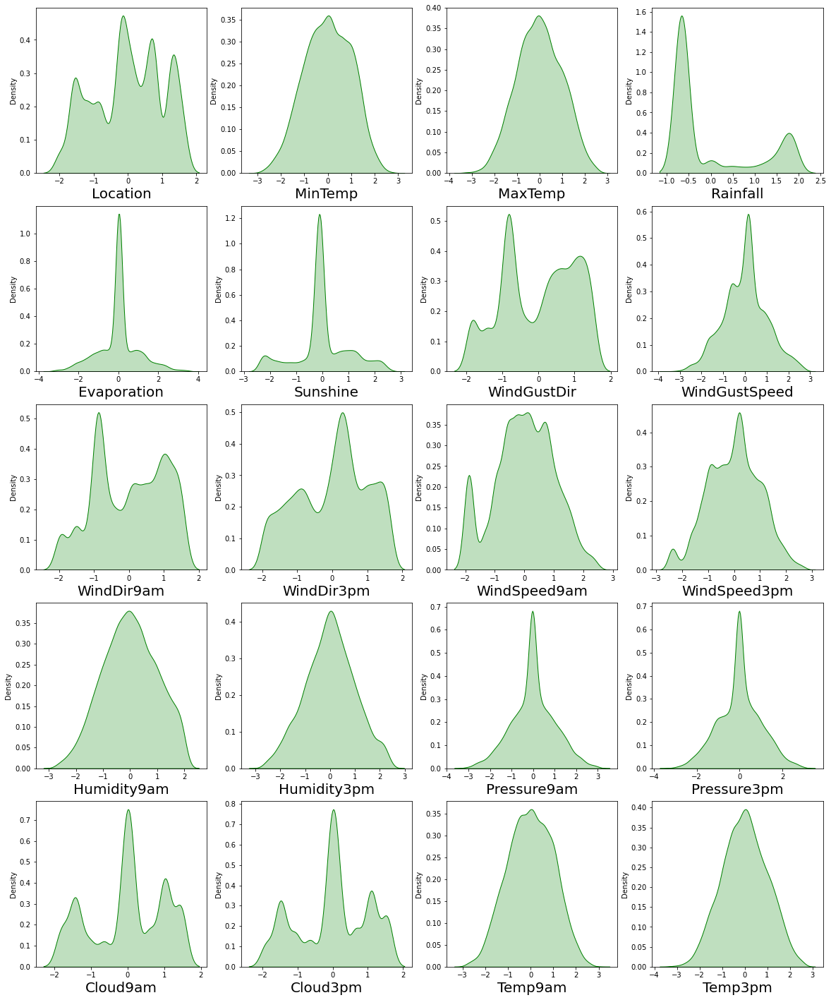

In [85]:
# After removing skewness let's check how the data has been distributed in each column.

plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for column in x:
    if plotnumber<=20:
        ax = plt.subplot(5,4,plotnumber)
        sns.distplot(x[column],color='g',kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

The data is not normal but the skewness has been almost reduced in all the columns.

In [86]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,0.729506,-0.910928,-1.406667,1.877698,-0.358206,-1.333482,1.474230,2.732910,1.506617,1.557391,0.709343,1.871343,-0.270227,0.611756,-1.868957,-0.956847,1.024518,1.103055,-0.962838,-1.328515,1.811398
1,1.302885,0.985468,0.963149,-0.664938,0.024946,-0.111997,-1.431554,1.139940,-0.614143,-1.592554,0.536931,1.340387,-0.390157,-0.256906,0.512610,0.408832,0.006424,0.010209,1.309743,0.971709,-0.552060
2,1.302885,0.401054,-0.179473,1.300951,1.345366,-0.111997,0.654634,0.732951,1.506617,0.518178,0.792366,1.064479,-1.580505,0.074022,-0.899641,-0.474664,0.006424,0.010209,0.312069,-0.313615,1.811398
3,0.433938,0.437685,0.040787,1.208835,0.024946,-0.111997,-0.572251,-1.766802,0.661125,-0.594647,-0.962689,-1.208701,1.177850,-0.312746,-0.033167,-0.024855,0.006424,0.010209,-0.009948,0.174579,1.811398
4,1.302885,-0.705921,-0.773167,0.009093,0.024946,-0.111997,1.319660,-0.676844,1.347483,0.940684,0.952775,-0.027926,2.046257,0.822635,1.228190,1.491742,-0.226389,0.010209,-1.197857,-0.628080,-0.552060
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7654,0.131277,0.032654,0.318753,-0.664938,0.024946,-0.111997,-0.826693,0.160647,-0.614143,0.302831,-0.962689,0.182297,-0.568072,-0.090589,-0.033167,-0.024855,0.185685,-1.063175,0.704716,0.341049,-0.552060
7655,1.302885,0.401054,0.205611,-0.664938,0.024946,-0.111997,-1.831206,1.139940,-1.942494,-1.878821,0.709343,1.871343,0.470201,0.291042,-0.308874,0.002985,1.024518,1.545257,0.597726,0.274922,-0.552060
7656,-0.179705,-0.761755,0.007353,-0.664938,-0.673519,1.689611,0.997479,-0.249752,-0.880542,0.730706,0.354813,-0.703631,-0.859106,-0.652373,-0.006350,-0.150054,-1.419508,-1.063175,-0.386597,-0.100167,-0.552060
7657,1.302885,0.693697,0.286609,1.657207,0.024946,-0.111997,0.285602,0.871375,0.074589,0.084340,0.161112,0.683660,1.177850,0.074022,-0.393065,-0.167087,1.450072,1.545257,0.312069,0.341049,1.811398


I have scaled the data using standard scalarizaion method to overcome with the issue of data biasness.

As we have observed in the heat map there is multicollinearity issue exists in the data, So let's check the VIF value and if the columns have VIF greater than 10 then we can drop those columns.

# Checking VIF(Variance Inflation Factor) values

In [88]:
# Finding varience inflation factor in each scaled column i.e, x.shape[1] (1/(1-R2))

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.169535,Location
1,8.491150,MinTemp
2,26.970186,MaxTemp
3,8.727975,Rainfall
4,1.605275,Evaporation
5,2.109498,Sunshine
6,1.601140,WindGustDir
7,2.205929,WindGustSpeed
8,1.341714,WindDir9am
9,1.476725,WindDir3pm


By checking VIF value we can find the features which causing multicollinearity problem. Here we can find the feature Temp3pm, MaxTemp, Pressure9am, Pressure3pm and Temp9am have VIF value greater than 10 which means they have high correlation with the other features. We will drop one of the column first, if the same issue exist then we will try to remove the column having high VIF(above 10).

In [89]:
# Dropping TotalCharges column
x.drop("Temp3pm",axis=1,inplace=True)

In [90]:
# Again checking VIF value to confirm whether the multicollinearity still exists or not
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.164647,Location
1,8.401911,MinTemp
2,9.859530,MaxTemp
3,8.727945,Rainfall
4,1.605269,Evaporation
5,2.109417,Sunshine
6,1.598654,WindGustDir
7,2.183206,WindGustSpeed
8,1.341525,WindDir9am
9,1.475904,WindDir3pm


There are still some columns with VIF greater than 10. We will again drop one of the columns and check VIF.

In [91]:
# Dropping TotalCharges column
x.drop("Pressure9am",axis=1,inplace=True)

In [92]:
# Again checking VIF value to confirm whether the multicollinearity still exists or not
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.164525,Location
1,8.256193,MinTemp
2,9.516628,MaxTemp
3,8.701832,Rainfall
4,1.589306,Evaporation
5,2.101420,Sunshine
6,1.585102,WindGustDir
7,2.164062,WindGustSpeed
8,1.319418,WindDir9am
9,1.407810,WindDir3pm


Column Temp9am still has VIF greater than 10. We will drop it and check VIF.

In [93]:
# Dropping TotalCharges column
x.drop("Temp9am",axis=1,inplace=True)

In [94]:
# Again checking VIF value to confirm whether the multicollinearity still exists or not
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.158441,Location
1,4.615432,MinTemp
2,5.546092,MaxTemp
3,8.694871,Rainfall
4,1.588550,Evaporation
5,2.092999,Sunshine
6,1.584924,WindGustDir
7,2.133130,WindGustSpeed
8,1.319414,WindDir9am
9,1.407793,WindDir3pm


All the columns have VIF less than 10 which means the data is free from multicollinearity problem. So we can move further to build our machine learning models.

In [95]:
y.value_counts()

0    5899
1    1760
Name: RainTomorrow, dtype: int64

Here we can observe the data is not balanced, since it is classification problem we will balance the data using oversampling method.

# Oversampling

In [97]:
# Oversampling the data
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x, y = SM.fit_resample(x,y)

In [98]:
# Checking value count of target column
y.value_counts()

0    5899
1    5899
Name: RainTomorrow, dtype: int64

We have used oversampling method to balance the data and checked the value count. Since the highest count of RainTomorrow column is 5899 so the data is balanced by oversampling all the categories to the count 5899. Finally the data is also balanced then we can build our machine leaning classification models.

In [99]:
# DataFrame after preprocessing and data cleaning
x.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,RainToday
0,0.729506,-0.910928,-1.406667,1.877698,-0.358206,-1.333482,1.474230,2.732910,1.506617,1.557391,0.709343,1.871343,-0.270227,0.611756,-0.956847,1.024518,1.103055,1.811398
1,1.302885,0.985468,0.963149,-0.664938,0.024946,-0.111997,-1.431554,1.139940,-0.614143,-1.592554,0.536931,1.340387,-0.390157,-0.256906,0.408832,0.006424,0.010209,-0.552060
2,1.302885,0.401054,-0.179473,1.300951,1.345366,-0.111997,0.654634,0.732951,1.506617,0.518178,0.792366,1.064479,-1.580505,0.074022,-0.474664,0.006424,0.010209,1.811398
3,0.433938,0.437685,0.040787,1.208835,0.024946,-0.111997,-0.572251,-1.766802,0.661125,-0.594647,-0.962689,-1.208701,1.177850,-0.312746,-0.024855,0.006424,0.010209,1.811398
4,1.302885,-0.705921,-0.773167,0.009093,0.024946,-0.111997,1.319660,-0.676844,1.347483,0.940684,0.952775,-0.027926,2.046257,0.822635,1.491742,-0.226389,0.010209,-0.552060


The dataframe after cleaning and preprocessing.

We have done with the preprocessing and data cleaning. Now let's move to build the model.

# Modeling

# Finding best random state

In [100]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state =i)
    DTC = RandomForestClassifier()
    DTC.fit(x_train, y_train)
    pred = DTC.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.9389830508474576  on Random_state  185


The best accuracy score is 93.89% at random state 185

# Creating train_test split

In [101]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=maxRS)

# Classification Algorithms

In [102]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from xgboost import XGBClassifier as xgb
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.model_selection import cross_val_score

# Random Forest Classifier

In [103]:
# Checking accuracy for Random Forest Classifier
RFC = RandomForestClassifier()
RFC.fit(x_train,y_train)

# Prediction
predRFC = RFC.predict(x_test)

rfc=accuracy_score(y_test, predRFC)
print(rfc)
print(confusion_matrix(y_test, predRFC))
print(classification_report(y_test,predRFC))

0.9333333333333333
[[1661  119]
 [ 117 1643]]
              precision    recall  f1-score   support

           0       0.93      0.93      0.93      1780
           1       0.93      0.93      0.93      1760

    accuracy                           0.93      3540
   macro avg       0.93      0.93      0.93      3540
weighted avg       0.93      0.93      0.93      3540



The accuracy using Random forest classifier is 93.33%

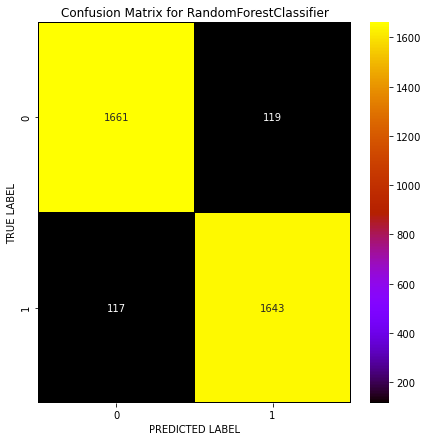

In [104]:
# Lets plot confusion matrix for RandomForestClassifier
cm = confusion_matrix(y_test,predRFC)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="gnuplot",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for RandomForestClassifier')
plt.show()

With the help of confusion matrix we can able observe the true positive rate, false positive rate, true negative rate and false negative rate. And is plotted predicted value againt True values.

# Logistic Regression

In [105]:
# Checking accuracy for Logistic Regression Classifier
LR = LogisticRegression()
LR.fit(x_train,y_train)

# Prediction
predLR = LR.predict(x_test)

lr=accuracy_score(y_test, predLR)
print(lr)
print(confusion_matrix(y_test, predLR))
print(classification_report(y_test,predLR))

0.7822033898305085
[[1431  349]
 [ 422 1338]]
              precision    recall  f1-score   support

           0       0.77      0.80      0.79      1780
           1       0.79      0.76      0.78      1760

    accuracy                           0.78      3540
   macro avg       0.78      0.78      0.78      3540
weighted avg       0.78      0.78      0.78      3540



The accuracy score using Logistic classifier is 78.22%

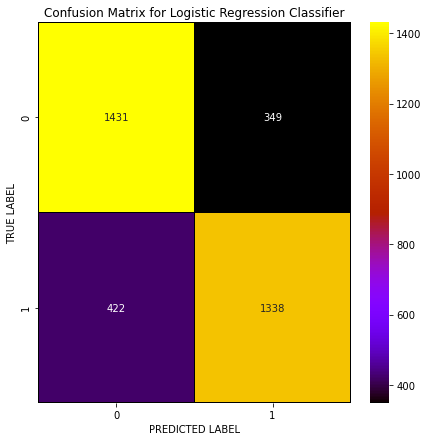

In [106]:
# Lets plot confusion matrix for Logistic Regression
cm = confusion_matrix(y_test,predLR)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="gnuplot",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Logistic Regression Classifier')
plt.show()

# Support Vector Machine Classifier

In [107]:
# Checking accuracy for Support Vector Machine Classifier
svc = SVC()
svc.fit(x_train,y_train)

# Prediction
predsvc = svc.predict(x_test)

sv=accuracy_score(y_test, predsvc)
print(sv)
print(confusion_matrix(y_test, predsvc))
print(classification_report(y_test,predsvc))

0.8596045197740113
[[1500  280]
 [ 217 1543]]
              precision    recall  f1-score   support

           0       0.87      0.84      0.86      1780
           1       0.85      0.88      0.86      1760

    accuracy                           0.86      3540
   macro avg       0.86      0.86      0.86      3540
weighted avg       0.86      0.86      0.86      3540



The accuracy score using support vector machine classifier is 85.96%

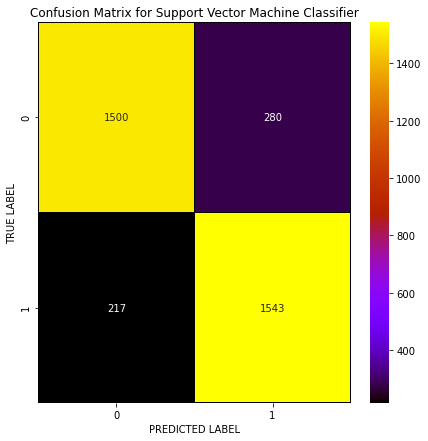

In [108]:
# Lets plot confusion matrix for Support Vector Machine Classifier
cm = confusion_matrix(y_test,predsvc)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="gnuplot",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Support Vector Machine Classifier')
plt.show()

# Gradient Boosting Classifier

In [109]:
# Checking accuracy for Gradient Boosting Classifier
GB = GradientBoostingClassifier()
GB.fit(x_train,y_train)

# Prediction
predGB = GB.predict(x_test)

gbc=accuracy_score(y_test, predGB)
print(gbc)
print(confusion_matrix(y_test, predGB))
print(classification_report(y_test,predGB))

0.8573446327683616
[[1546  234]
 [ 271 1489]]
              precision    recall  f1-score   support

           0       0.85      0.87      0.86      1780
           1       0.86      0.85      0.86      1760

    accuracy                           0.86      3540
   macro avg       0.86      0.86      0.86      3540
weighted avg       0.86      0.86      0.86      3540



The accuracy score using gradient boosting classifer is 85.73%

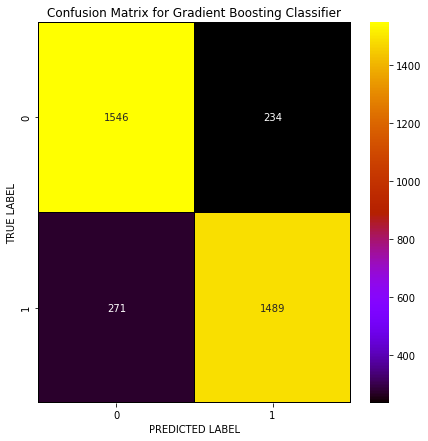

In [110]:
# Lets plot confusion matrix for Gradient Boosting Classifier
cm = confusion_matrix(y_test,predGB)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="gnuplot",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Gradient Boosting Classifier')
plt.show()

# AdaBoost Classifier

In [111]:
# Checking accuracy for AdaBoost Classifier
ABC = AdaBoostClassifier()
ABC.fit(x_train,y_train)

# Prediction
predABC = ABC.predict(x_test)

abc=accuracy_score(y_test, predABC)
print(abc)
print(confusion_matrix(y_test, predABC))
print(classification_report(y_test,predABC))

0.8344632768361582
[[1506  274]
 [ 312 1448]]
              precision    recall  f1-score   support

           0       0.83      0.85      0.84      1780
           1       0.84      0.82      0.83      1760

    accuracy                           0.83      3540
   macro avg       0.83      0.83      0.83      3540
weighted avg       0.83      0.83      0.83      3540



The accuracy using Adaboost Classifier is 83.44%

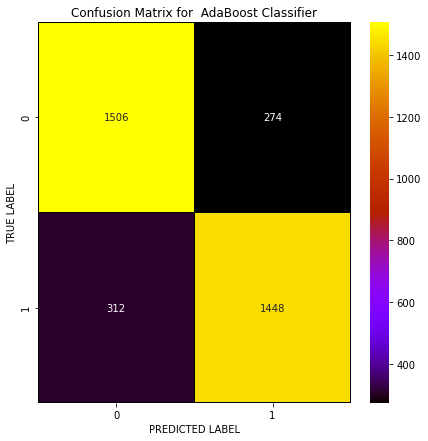

In [112]:
# Lets plot confusion matrix for  AdaBoost Classifier
cm = confusion_matrix(y_test,predABC)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="gnuplot",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for  AdaBoost Classifier')
plt.show()

# BaggingClassifier

In [113]:
# Checking accuracy for BaggingClassifier
BC = BaggingClassifier()
BC.fit(x_train,y_train)

# Prediction
predBC = BC.predict(x_test)

bc=accuracy_score(y_test, predBC)
print(bc)
print(confusion_matrix(y_test, predBC))
print(classification_report(y_test,predBC))

0.9036723163841808
[[1647  133]
 [ 208 1552]]
              precision    recall  f1-score   support

           0       0.89      0.93      0.91      1780
           1       0.92      0.88      0.90      1760

    accuracy                           0.90      3540
   macro avg       0.90      0.90      0.90      3540
weighted avg       0.90      0.90      0.90      3540



The accuracy using Bagging Classifier is 90.36%

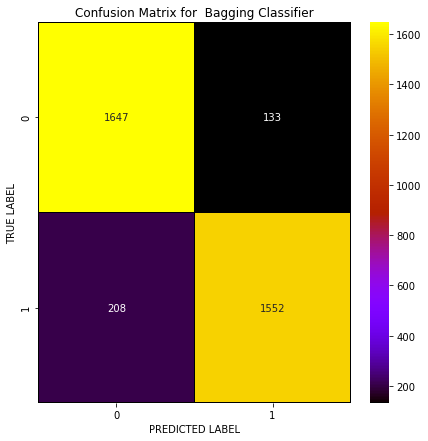

In [114]:
# Lets plot confusion matrix for  Bagging Classifier
cm = confusion_matrix(y_test,predBC)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="gnuplot",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for  Bagging Classifier')
plt.show()

# XGBClassifier

In [115]:
# Checking accuracy for XGBClassifier
XGB = xgb(verbosity=0)
XGB.fit(x_train,y_train)

# Prediction
predXGB = XGB.predict(x_test)
xg=accuracy_score(y_test, predXGB)
print(accuracy_score(y_test, predXGB))
print(confusion_matrix(y_test, predXGB))
print(classification_report(y_test,predXGB))

0.9336158192090396
[[1687   93]
 [ 142 1618]]
              precision    recall  f1-score   support

           0       0.92      0.95      0.93      1780
           1       0.95      0.92      0.93      1760

    accuracy                           0.93      3540
   macro avg       0.93      0.93      0.93      3540
weighted avg       0.93      0.93      0.93      3540



The accuracy using XBG Classifier is 93.36%

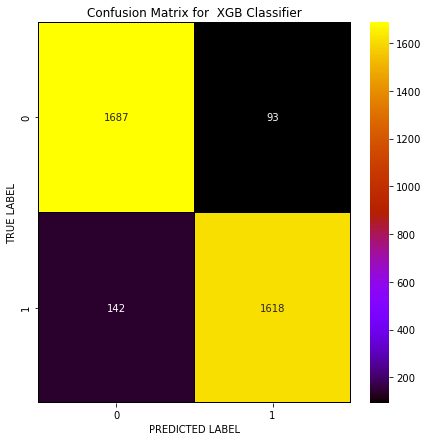

In [116]:
# Lets plot confusion matrix for  XGBClassifier
cm = confusion_matrix(y_test,predXGB)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="gnuplot",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for  XGB Classifier')
plt.show()

# Checking cross validation score

In [117]:
# cv score for Random Forest Classifier
rf_cv=cross_val_score(RFC,x,y,cv=5).mean()
print(rf_cv)

0.9355841314547245


In [118]:
# cv score for Logistic Regression
lr_cv=cross_val_score(LR,x,y,cv=5).mean()
print(lr_cv)

0.779538191276108


In [119]:
# cv score for Support Vector Machine Classifier
sv_cv=cross_val_score(svc,x,y,cv=5).mean()
print(sv_cv)

0.8548920111222078


In [120]:
# cv score for Gradient Boosting Classifier
gb_cv=cross_val_score(GB,x,y,cv=5).mean()
gb_cv

0.8533687787844606

In [121]:
# cv score for AdaBoosting Classifier
ada_cv=cross_val_score(ABC,x,y,cv=5).mean()
print(ada_cv)

0.8188698529253274


In [122]:
# cv score for Bagging Classifier
bc_cv=cross_val_score(BC,x,y,cv=5).mean()
print(bc_cv)

0.9098184019370459


In [123]:
# cv score for XGB Classifier
xbg_cv=cross_val_score(XGB,x,y,cv=5).mean()
print(xbg_cv)

0.9205017926297412


In [124]:
model_list=['Random Forest Classifier',' Logistic Regression','Support Vector Machine Classifier','Gradient Boosting Classifier','AdaBoosting Classifier','Bagging Classifier','XGB Classifier']
accuracyscore=[rfc,lr,sv,gbc,abc,bc,xg]
accuracyscore

[0.9333333333333333,
 0.7822033898305085,
 0.8596045197740113,
 0.8573446327683616,
 0.8344632768361582,
 0.9036723163841808,
 0.9336158192090396]

In [127]:
crossval=[rf_cv,lr_cv,sv_cv,gb_cv,ada_cv,bc_cv,xbg_cv]

In [128]:
models=pd.DataFrame({})
models["Classifier"]=model_list
models["Accuracy_score"]=accuracyscore
models["Cross Validation_Score"]=crossval

In [129]:
models

,Classifier,Accuracy_score,Cross Validation_Score
0,Random Forest Classifier,0.933333,0.935584
1,Logistic Regression,0.782203,0.779538
2,Support Vector Machine Classifier,0.859605,0.854892
3,Gradient Boosting Classifier,0.857345,0.853369
4,AdaBoosting Classifier,0.834463,0.818870
5,Bagging Classifier,0.903672,0.909818
6,XGB Classifier,0.933616,0.920502


From the difference between the accuracy score and the cross validation score we can conclude that XGBs Classifer as our best fitting model whch is giving very less difference compare to other models.

# Hyper Parameter Tuning

In [130]:
# XGB Classifier
from sklearn.model_selection import GridSearchCV

parameters = {'criterion' : ['gini','entropy'],
              'random_state' : [10, 50, 1000],
              'max_depth' : [0, 10, 20],
              'n_jobs' : [-2, -1, 1],
              'n_estimators' : [50,100, 200, 300]}

In [133]:
GCV=GridSearchCV(xgb(verbosity=0),parameters,cv=5)

In [134]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     gamma=None, gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_bin=None,
                                     max_ca...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, reg_alpha=None,
                                     reg_lambda=None, ...),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [0, 10, 20],
                         'n_estimators': [50, 100, 200, 300],
                         'n_jobs': [-2, -1, 1],
                         'random_state': [10, 50, 1000]})

In [136]:
GCV.best_params_

{'criterion': 'gini',
 'max_depth': 20,
 'n_estimators': 300,
 'n_jobs': -2,
 'random_state': 10}

In [138]:
FinalModel = xgb(criterion='gini', max_depth=20, n_estimators=300, n_jobs=-2, random_state=10)
FinalModel.fit(x_train, y_train)
pred = FinalModel.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

93.8135593220339


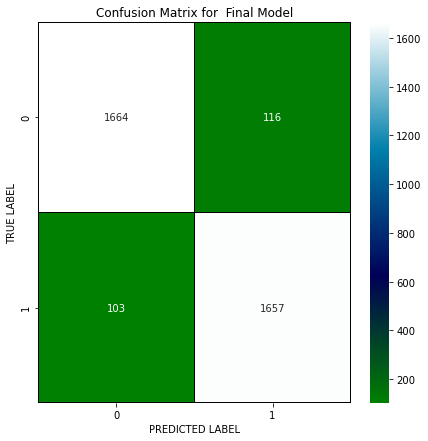

In [139]:
# Lets plot confusion matrix for  FinalModel
cm = confusion_matrix(y_test,pred)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="ocean",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for  Final Model')
plt.show()

# Plotting AUC ROC curve for all models

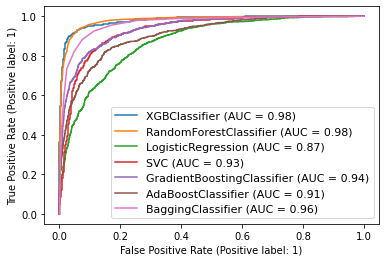

In [140]:
# Plotting for all the models used here
from sklearn import datasets 
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import plot_roc_curve 


disp = plot_roc_curve(XGB, x_test, y_test)    # ax_=Axes with confusion matrix
plot_roc_curve(RFC, x_test, y_test, ax=disp.ax_)
plot_roc_curve(LR, x_test, y_test, ax=disp.ax_)
plot_roc_curve(svc, x_test, y_test, ax=disp.ax_)
plot_roc_curve(GB, x_test, y_test, ax=disp.ax_)
plot_roc_curve(ABC, x_test, y_test, ax=disp.ax_)
plot_roc_curve(BC, x_test, y_test, ax=disp.ax_)

plt.legend(prop={'size':11}, loc='lower right')
plt.show()

# Plotting ROC and Compare AUC for the best model

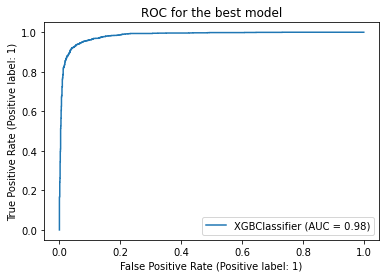

In [141]:
# Let's check the Auc for the best model after hyper parameter tuning
plot_roc_curve(FinalModel, x_test, y_test)
plt.title("ROC for the best model")
plt.show()

# Saving the model

In [145]:
# Saving the model using .pkl
import joblib
joblib.dump(FinalModel,"WeatherForecastRainTomorrow.pkl")

['WeatherForecastRainTomorrow.pkl']

# Predicting the saved model

In [148]:
# Loading the saved model
Model1=joblib.load("WeatherForecastRainTomorrow.pkl")

#Prediction
prediction_RainTom = Model1.predict(x_test)
prediction_RainTom

array([1, 1, 0, ..., 1, 0, 0])

Here we have loaded our saved model of predictioon for RainTomorrow and got the predicted next day rain values which are displayed above.

In [151]:
Data=pd.DataFrame([Model1.predict(x_test)[:],y_test[:]],index=["Predicted","Actual"]).T
Data.head()

,Predicted,Actual
0,1,1
1,1,1
2,0,0
3,1,1
4,1,1


We have created a DataFrame of Actual and Predicted Rain values . Here Actual RainTomorrow and predicted RainTomorrow values are almost same.


Let's do the prediction for Rainfall variable.

# Part (b) : Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.

# Visualizing the correlation between label Rainfall and features using bar plot

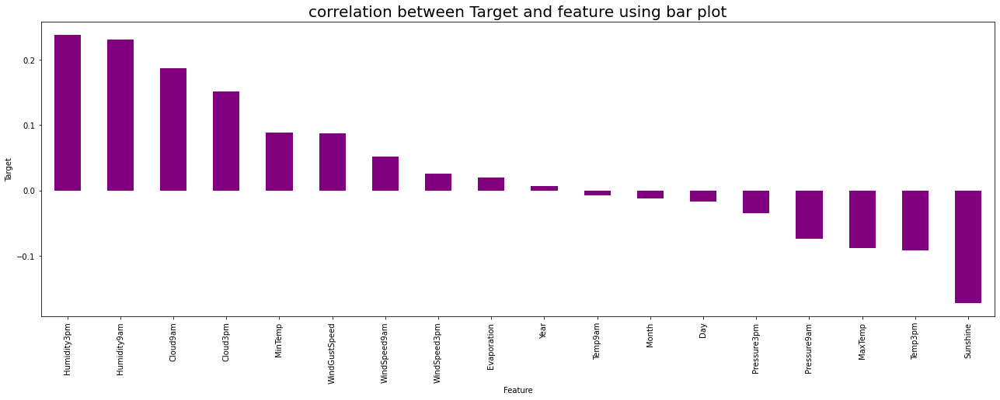

In [152]:
plt.figure(figsize=(22,7))
df.corr()['Rainfall'].sort_values(ascending=False).drop(['Rainfall']).plot(kind='bar',color='purple')
plt.xlabel('Feature',fontsize=10)
plt.ylabel('Target',fontsize=10)
plt.title('correlation between Target and feature using bar plot',fontsize=20)
plt.show()


# Separating the features and label variables into X and Y

In [153]:
X = new_df.drop("Rainfall", axis=1)
Y = new_df["Rainfall"]

We have separated dependent and independent variables and stored them in Y and X columns respectively.

In [154]:
# Dimension of X
X.shape

(7659, 21)

In [155]:
# Dimension of Y
Y.shape

(7659,)

# Checking for skewness

In [156]:
X.skew()

Location        -0.040806
MinTemp         -0.069722
MaxTemp          0.316888
Evaporation      1.282918
Sunshine        -0.724567
WindGustDir      0.115677
WindGustSpeed    0.523174
WindDir9am       0.159135
WindDir3pm      -0.118308
WindSpeed9am     0.720106
WindSpeed3pm     0.309801
Humidity9am     -0.228562
Humidity3pm      0.128530
Pressure9am      0.032112
Pressure3pm      0.063423
Cloud9am        -0.339484
Cloud3pm        -0.257514
Temp9am         -0.038058
Temp3pm          0.331266
RainToday        1.259585
RainTomorrow     1.284798
dtype: float64

The following columns contains skewness greater than +0.5 and -0.5.

- Evaporation

- Sunshine

- WindGustSpeed

- WindSpeed9am

- RainToday

- RainTomorrow

# Removing skewness using yeo-johnson method

In [157]:
# Making the skew less than or equal to +0.5 and -0.5 for better prediction using yeo-johnson method
skew=['Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','RainToday','RainTomorrow']
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box-cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box-cox' or 'yeo-johnson'\n"

In [158]:
X[skew] = scaler.fit_transform(X[skew].values)
X[skew].head()

,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,RainToday,RainTomorrow
7548,-0.358206,-1.333482,2.732910,0.709343,1.811398,1.830766
4165,0.024946,-0.111997,1.139940,0.536931,-0.552060,-0.546219
4075,1.345366,-0.111997,0.732951,0.792366,1.811398,-0.546219
2666,0.024946,-0.111997,-1.766802,-0.962689,1.811398,-0.546219
4284,0.024946,-0.111997,-0.676844,0.952775,-0.552060,-0.546219


In [159]:
# Checking skewness after using yeo-johnson method
X.skew()

Location        -0.040806
MinTemp         -0.069722
MaxTemp          0.316888
Evaporation      0.059720
Sunshine        -0.057076
WindGustDir      0.115677
WindGustSpeed    0.003388
WindDir9am       0.159135
WindDir3pm      -0.118308
WindSpeed9am    -0.114098
WindSpeed3pm     0.309801
Humidity9am     -0.228562
Humidity3pm      0.128530
Pressure9am      0.032112
Pressure3pm      0.063423
Cloud9am        -0.339484
Cloud3pm        -0.257514
Temp9am         -0.038058
Temp3pm          0.331266
RainToday        1.259585
RainTomorrow     1.284798
dtype: float64

We have removed the skewness in all the columns except RainToday and RainTomorrow. This is because these columns may have some extreme test level. So keeping the skewness in those columns as it is and moving further.

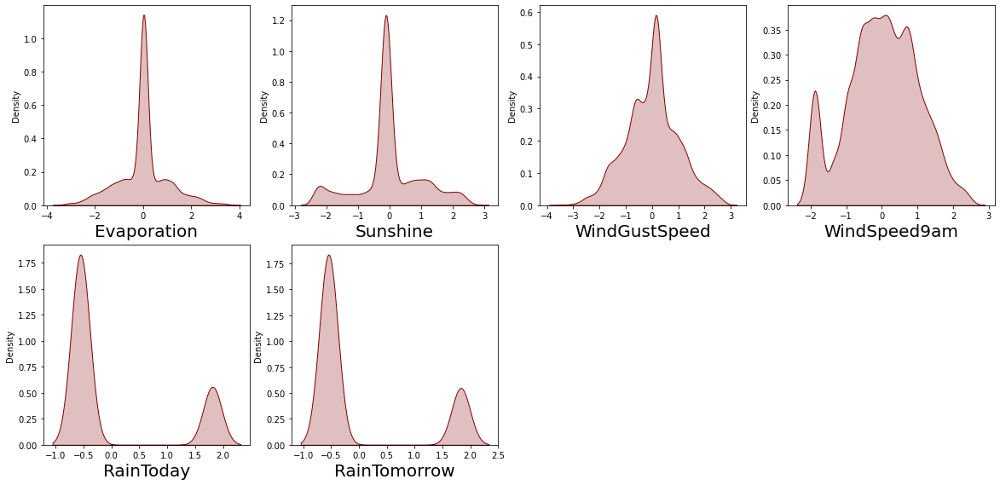

In [161]:
# After removing skewness let's check how the data has been distributed in each column.

plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for column in X[skew]:
    if plotnumber<=20:
        ax = plt.subplot(5,4,plotnumber)
        sns.distplot(X[column],color='maroon',kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

# Feature Scaling using MinMaxScaler

In [162]:
from sklearn.preprocessing import MinMaxScaler

mms=MinMaxScaler()
X = pd.DataFrame(mms.fit_transform(X), columns=X.columns)
X

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0.727273,0.333333,0.224852,0.426507,0.196977,1.000000,1.000000,1.000000,1.000000,0.605147,0.804348,0.560976,0.602151,0.202703,0.349593,0.875000,0.875000,0.319018,0.234756,1.0,1.0
1,0.909091,0.673267,0.630178,0.482746,0.444090,0.066667,0.741412,0.266667,0.066667,0.564786,0.673913,0.536585,0.430108,0.583784,0.566396,0.570828,0.562898,0.708589,0.631098,0.0,0.0
2,0.909091,0.567657,0.417160,0.676558,0.444090,0.666667,0.675345,1.000000,0.666667,0.624582,0.608696,0.280488,0.494624,0.356757,0.425474,0.570828,0.562898,0.536810,0.393293,1.0,0.0
3,0.636364,0.574257,0.455621,0.482746,0.444090,0.266667,0.269558,0.666667,0.333333,0.213729,0.152174,0.841463,0.419355,0.495682,0.496913,0.570828,0.562898,0.481595,0.478659,1.0,0.0
4,0.909091,0.369637,0.319527,0.482746,0.444090,0.933333,0.446492,0.933333,0.800000,0.662133,0.369565,1.000000,0.645161,0.700000,0.742547,0.500000,0.562898,0.279141,0.341463,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7654,0.545455,0.501429,0.505917,0.482746,0.444090,0.200000,0.582442,0.266667,0.600000,0.213729,0.413043,0.500000,0.462366,0.495682,0.496913,0.625000,0.250000,0.604294,0.509146,0.0,0.0
7655,0.909091,0.567657,0.485207,0.482746,0.444090,0.000000,0.741412,0.000000,0.000000,0.605147,0.804348,0.707317,0.537634,0.451351,0.501355,0.875000,1.000000,0.585890,0.496951,0.0,0.0
7656,0.454545,0.359736,0.449704,0.380225,0.808564,0.800000,0.515822,0.200000,0.733333,0.522152,0.239130,0.439024,0.354839,0.500000,0.476965,0.125000,0.250000,0.417178,0.429878,0.0,0.0
7657,0.909091,0.620462,0.500000,0.482746,0.444090,0.533333,0.697815,0.466667,0.533333,0.476808,0.521739,0.841463,0.494624,0.437838,0.474255,1.000000,1.000000,0.536810,0.509146,1.0,1.0


We have scaled the data using MinMaxScalar method to overcome with the issue of data biasness.

As we have observed in the heat map there is multicollinearity issue exists in the data, So let's check the VIF value and if the columns have VIF greater than 10 then we can drop those columns.

# Checking VIF values

In [163]:
# Finding varience inflation factor in each scaled column i.e, x.shape[1] (1/(1-R2))

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X.values,i)
              for i in range(len(X.columns))]
vif["Features"] = X.columns

# Let's check the values
vif

,VIF values,Features
0,4.965609,Location
1,70.580144,MinTemp
2,204.524884,MaxTemp
3,18.015811,Evaporation
4,12.817313,Sunshine
5,5.250831,WindGustDir
6,24.281351,WindGustSpeed
7,4.627844,WindDir9am
8,5.918838,WindDir3pm
9,8.692957,WindSpeed9am


The column Temp3pm has high VIF value compared to other features, we will remove this column to overcome with the issue of multicollinearity. After dropping the column will check VIF again, if we find the value above 10 then we will remove that column having high VIF. This process will continue until we get the VIF value less than 10.

In [164]:
# Dropping Temp3pm column
X.drop("Temp3pm",axis=1,inplace=True)

In [165]:
# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X.values,i)
              for i in range(len(X.columns))]
vif["Features"] = X.columns

# Let's check the values
vif

,VIF values,Features
0,4.962711,Location
1,70.309652,MinTemp
2,72.517817,MaxTemp
3,17.973618,Evaporation
4,12.796890,Sunshine
5,5.248172,WindGustDir
6,24.281347,WindGustSpeed
7,4.627833,WindDir9am
8,5.917383,WindDir3pm
9,8.685490,WindSpeed9am


The column Pressure3pm has high VIF value compared ot other columns. Let's drop this column.

In [166]:
# Dropping Pressure3pm column
X.drop("Pressure3pm",axis=1,inplace=True)

# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X.values,i)
              for i in range(len(X.columns))]
vif["Features"] = X.columns

# Let's check the values
vif

,VIF values,Features
0,4.959547,Location
1,69.105210,MinTemp
2,69.164774,MaxTemp
3,17.902000,Evaporation
4,12.729438,Sunshine
5,5.225644,WindGustDir
6,24.264893,WindGustSpeed
7,4.558504,WindDir9am
8,5.706445,WindDir3pm
9,8.671838,WindSpeed9am


The column Temp9am  has high VIF value compared ot other columns. Let's drop this column.

In [167]:
# Dropping Temp9am column
X.drop("Temp9am",axis=1,inplace=True)

# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X.values,i)
              for i in range(len(X.columns))]
vif["Features"] = X.columns

# Let's check the values
vif

,VIF values,Features
0,4.920331,Location
1,38.802995,MinTemp
2,35.991883,MaxTemp
3,17.901161,Evaporation
4,12.550637,Sunshine
5,5.210081,WindGustDir
6,24.207474,WindGustSpeed
7,4.544644,WindDir9am
8,5.703721,WindDir3pm
9,8.599805,WindSpeed9am


The column MinTemp  has high VIF value compared ot other columns. Let's drop this column.

In [168]:
# Dropping MinTemp column
X.drop("MinTemp",axis=1,inplace=True)

# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X.values,i)
              for i in range(len(X.columns))]
vif["Features"] = X.columns

# Let's check the values
vif

,VIF values,Features
0,4.919698,Location
1,11.512742,MaxTemp
2,17.808237,Evaporation
3,12.242934,Sunshine
4,5.187819,WindGustDir
5,24.207218,WindGustSpeed
6,4.480031,WindDir9am
7,5.669294,WindDir3pm
8,8.398986,WindSpeed9am
9,9.171198,WindSpeed3pm


In [169]:
# The column Humidity9am has high VIF value compared ot other columns. Let's drop this column.

# Dropping Humidity9am column
X.drop("Humidity9am",axis=1,inplace=True)

# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X.values,i)
              for i in range(len(X.columns))]
vif["Features"] = X.columns

# Let's check the values
vif

,VIF values,Features
0,4.885554,Location
1,11.314916,MaxTemp
2,17.704625,Evaporation
3,12.146785,Sunshine
4,5.168217,WindGustDir
5,24.062589,WindGustSpeed
6,4.473614,WindDir9am
7,5.646405,WindDir3pm
8,7.686275,WindSpeed9am
9,9.163696,WindSpeed3pm


In [170]:
# The column WindGustSpeed has high VIF value compared ot other columns. Let's drop this column.

# Dropping WindGustSpeed column
X.drop("WindGustSpeed",axis=1,inplace=True)

# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X.values,i)
              for i in range(len(X.columns))]
vif["Features"] = X.columns

# Let's check the values
vif

,VIF values,Features
0,4.810391,Location
1,10.866202,MaxTemp
2,17.408538,Evaporation
3,12.000805,Sunshine
4,5.158376,WindGustDir
5,4.429770,WindDir9am
6,5.448850,WindDir3pm
7,6.980355,WindSpeed9am
8,7.214667,WindSpeed3pm
9,10.893659,Humidity3pm


In [171]:
# The column Evaporation has high VIF value compared ot other columns. Let's drop this column.

# Dropping Evaporation column
X.drop("Evaporation",axis=1,inplace=True)

# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X.values,i)
              for i in range(len(X.columns))]
vif["Features"] = X.columns

# Let's check the values
vif

,VIF values,Features
0,4.789595,Location
1,8.704568,MaxTemp
2,10.088803,Sunshine
3,5.156070,WindGustDir
4,4.428278,WindDir9am
5,5.393170,WindDir3pm
6,6.874577,WindSpeed9am
7,7.214660,WindSpeed3pm
8,10.816602,Humidity3pm
9,8.511525,Pressure9am


Finally our data is free from multicollinearity problem.

In [172]:
# Checking dataframe after removing the columns
X.head()

,Location,MaxTemp,Sunshine,WindGustDir,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,RainToday,RainTomorrow
0,0.727273,0.224852,0.196977,1.000000,1.000000,1.000000,0.605147,0.804348,0.602151,0.202703,0.875000,0.875000,1.0,1.0
1,0.909091,0.630178,0.444090,0.066667,0.266667,0.066667,0.564786,0.673913,0.430108,0.583784,0.570828,0.562898,0.0,0.0
2,0.909091,0.417160,0.444090,0.666667,1.000000,0.666667,0.624582,0.608696,0.494624,0.356757,0.570828,0.562898,1.0,0.0
3,0.636364,0.455621,0.444090,0.266667,0.666667,0.333333,0.213729,0.152174,0.419355,0.495682,0.570828,0.562898,1.0,0.0
4,0.909091,0.319527,0.444090,0.933333,0.933333,0.800000,0.662133,0.369565,0.645161,0.700000,0.500000,0.562898,0.0,0.0


In [173]:
X.shape

(7659, 14)

After removing the colums containing VIF above 10, the dataframe contains 14 columns. We have done all the preprocessing and data cleaning, now our dataset is ready for building the machine learning models.

# Modeling

# Finding best random state

In [174]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [175]:
from sklearn.ensemble import RandomForestRegressor
maxAccu=0
maxRS=0
for i in range(1,200):
    X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=.30, random_state=i)
    mod = RandomForestRegressor()
    mod.fit(X_train, Y_train)
    pred = mod.predict(X_test)
    acc=r2_score(Y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Maximum r2 score is ",maxAccu," on Random_state ",maxRS)

Maximum r2 score is  0.6594968336012866  on Random_state  136


We have got the best random state and maximum R2 score.

# Creating new train test split

In [176]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=.30,random_state=maxRS)

# Regression Algorithms

In [177]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import BaggingRegressor
import xgboost as xgb
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn import metrics

# Random Forest Regressor

R2_Score: 0.6629230238118642
MAE: 1.0469621409921672
MSE: 7.756363792428199
RMSE: 2.785024917739193


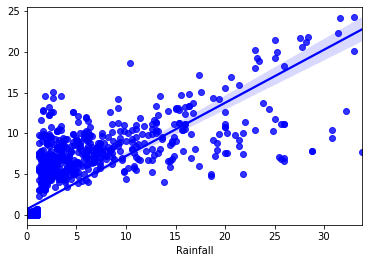

In [179]:
# Checking R2 score for Random Forest Regressor
RFR=RandomForestRegressor()
RFR.fit(X_train,Y_train)

# prediction
predRFR=RFR.predict(X_test)
rf1=r2_score(Y_test,predRFR)
print('R2_Score:',rf1)
print('MAE:',metrics.mean_absolute_error(Y_test, predRFR))
print('MSE:',metrics.mean_squared_error(Y_test, predRFR))
print("RMSE:",np.sqrt(metrics.mean_squared_error(Y_test, predRFR)))

# Visualizing the predicted values
sns.regplot(Y_test,predRFR,color="b")
plt.show()

We have created Random Forest Regressor and checked the evaluation metrics. The predicted R2 score for Random Forest Regressor is 66.29%.

# Decision Tree Regressor

R2_Score: 0.34895124257121557
MAE: 1.1951261966927762
MSE: 14.981061792863361
RMSE: 3.870537661987461


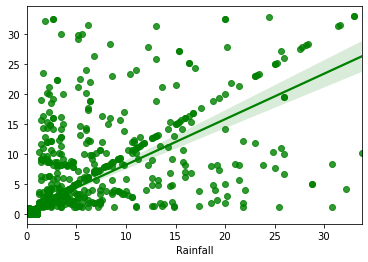

In [180]:
# Checking R2 score for Decision Tree Regressor
DTR=DecisionTreeRegressor()
DTR.fit(X_train,Y_train)

# prediction
predDTR=DTR.predict(X_test)
dt1=r2_score(Y_test,predDTR)
print('R2_Score:',dt1)
print('MAE:',metrics.mean_absolute_error(Y_test, predDTR))
print('MSE:',metrics.mean_squared_error(Y_test, predDTR))
print("RMSE:",np.sqrt(metrics.mean_squared_error(Y_test, predDTR)))

# Visualizing the predicteed values
sns.regplot(Y_test,predDTR,color="g")
plt.show()

We have created Decision Tree Regressor and checked the evaluation metrics. The predicted R2 score for Decision Tree Regressor is 34.89%.

# GradientBoosting Regressor

R2_Score: 0.5504643498469795
MAE: 1.3097357074973208
MSE: 10.344112136292754
RMSE: 3.216226381381254


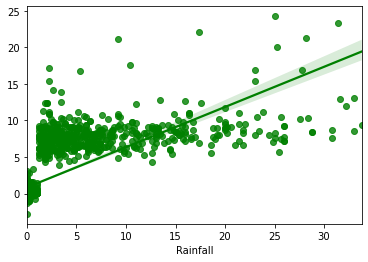

In [181]:
# Checking R2 score for GradientBoosting Regressor
GB=GradientBoostingRegressor()
GB.fit(X_train,Y_train)

# prediction
predGB=GB.predict(X_test)
gb2=r2_score(Y_test,predGB)
print('R2_Score:',gb2)

# Metric Evaluation
print('MAE:',metrics.mean_absolute_error(Y_test, predGB))
print('MSE:',metrics.mean_squared_error(Y_test, predGB))
print("RMSE:",np.sqrt(metrics.mean_squared_error(Y_test, predGB)))

# Visualizing the predicted values
sns.regplot(Y_test,predGB,color="g")
plt.show()

We have created Gradient Boosting Regressor and checked the evaluation metrics. The predicted R2 score for Gradient Boosting Regressor is 55.04%.

# KNeighbors Regressor

R2_Score: 0.4914447319172862
MAE: 1.2658485639686685
MSE: 11.702192515230635
RMSE: 3.4208467541283745


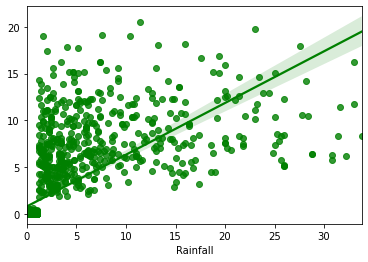

In [182]:
# Checking R2 score for KNeighbors Regressor
knn=KNN()
knn.fit(X_train,Y_train)

# prediction
predknn=knn.predict(X_test)
knr=r2_score(Y_test,predknn)
print('R2_Score:',knr)

# Metric Evaluation
print('MAE:',metrics.mean_absolute_error(Y_test, predknn))
print('MSE:',metrics.mean_squared_error(Y_test, predknn))
print("RMSE:",np.sqrt(metrics.mean_squared_error(Y_test, predknn)))

# Visualizing the predicted values
sns.regplot(Y_test,predknn,color="g")
plt.show()

We have created KNN Regressor and checked the evaluation metrics. The predicted R2 score for KNN Regressor is 49.14%.

# Bagging Regressor

R2_Score: 0.5978838608856045
MAE: 1.1178067885117495
MSE: 9.252957876414273
RMSE: 3.041867498168563


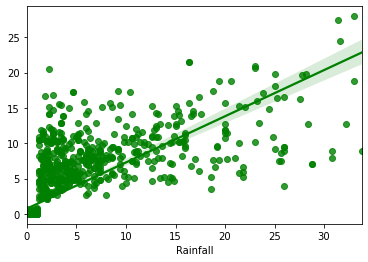

In [183]:
# Checking R2 score for BaggingRegressor

BR=BaggingRegressor()
BR.fit(X_train,Y_train)

# prediction
predBR=BR.predict(X_test)
br1=r2_score(Y_test,predBR)
print('R2_Score:',br1)

# Metric Evaluation
print('MAE:',metrics.mean_absolute_error(Y_test, predBR))
print('MSE:',metrics.mean_squared_error(Y_test, predBR))
print("RMSE:",np.sqrt(metrics.mean_squared_error(Y_test, predBR)))

# Visualizing the predicted values
sns.regplot(Y_test,predBR,color="g")
plt.show()

We have created Bagging Regressor and checked the evaluation metrics. The predicted R2 score for Bagging Regressor is 59.78%.

# XGB Regressor

R2_Score: 0.628329860061837
MAE: 1.1119671908068431
MSE: 8.552375332019357
RMSE: 2.924444448441337


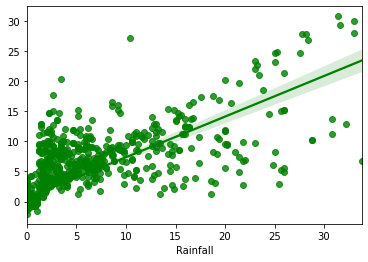

In [184]:
# Checking R2 score for XGB Regressor
from xgboost import XGBRegressor as xgb

XGB=xgb()
XGB.fit(X_train,Y_train)

# prediction
predXGB=XGB.predict(X_test)
xgb1=r2_score(Y_test,predXGB)
print('R2_Score:',xgb1)

# Metric Evaluation
print('MAE:',metrics.mean_absolute_error(Y_test, predXGB))
print('MSE:',metrics.mean_squared_error(Y_test, predXGB))
print("RMSE:",np.sqrt(metrics.mean_squared_error(Y_test, predXGB)))

# Visualizing the predicted values
sns.regplot(Y_test,predXGB,color="g")
plt.show()

We have created XGB Regressor and checked the evaluation metrics. The predicted R2 score for XGB Regressor is 62.83%.

# Checking the cross validation score

In [185]:
from sklearn.model_selection import cross_val_score

In [186]:
# Checking cv score for Random Forest Regressor
rfrcv=cross_val_score(RFR,X,Y,cv=5).mean()
print(rfrcv)

0.6230537206571112


In [187]:
# Checking cv score for Decision Tree Regressor
dtcv=cross_val_score(DTR,X,Y,cv=5).mean()
print(dtcv)

0.28669264302292163


In [188]:
# Checking cv score for Gradient Boosting Regressor
gbcv=cross_val_score(GB,X,Y,cv=5).mean()
print(gbcv)

0.5358285454030678


In [189]:
# Checking cv score for KNeighbors Regressor
kncv=cross_val_score(knn,X,Y,cv=5).mean()
print(kncv)

0.4836623745405437


In [190]:
# Checking cv score for Bagging Regressor
brcv=cross_val_score(BR,X,Y,cv=5).mean()
print(brcv)

0.5912507370802691


In [191]:
# Checking cv score for XGBRegressor
xgbcv=cross_val_score(XGB,X,Y,cv=5).mean()
print(xgbcv)

0.5866704900772493


In [192]:
model_list=['Random Forest Regressor','Decision Tree Regressor','Gradient Boosting Regressor','KNeighbors Regressor','Bagging Regressor','XGBRegressor']
accuracyscore1=[rf1,dt1,gb2,knr,br1,xgb1]
crossval1=[rfrcv,dtcv,gbcv,kncv,brcv,xgbcv]

In [193]:
models1=pd.DataFrame({})
models1['Regressor']=model_list
models1['Accuracy_Score']=accuracyscore1
models1['crossval']=crossval1

In [194]:
models1

,Regressor,Accuracy_Score,crossval
0,Random Forest Regressor,0.662923,0.623054
1,Decision Tree Regressor,0.348951,0.286693
2,Gradient Boosting Regressor,0.550464,0.535829
3,KNeighbors Regressor,0.491445,0.483662
4,Bagging Regressor,0.597884,0.591251
5,XGBRegressor,0.628330,0.586670


Above are the cross validation score for the models that we have used.

From the differences between the R2 score and Cross Validation Score we can conclude that RandomForest Regressor as our best fitting model. We will perform Hyper parameter tuning on the best model.

# Hyper parameter tuning

In [195]:
from sklearn.model_selection import GridSearchCV

In [202]:
#RandomForest Regressor

parameters = {'criterion':['mse', 'mae'],
             'max_features':['auto', 'sqrt', 'log2'],
             'n_estimators':[0,200],
             'max_depth':[2,3,4,6]}

These are the parameters of RandomForest Regressor.

In [203]:
GCV=GridSearchCV(RandomForestRegressor(),parameters,cv=5)

Running GridSearchCV for RandomForest Regressor.

In [204]:
GCV.fit(X_train,Y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'criterion': ['mse', 'mae'], 'max_depth': [2, 3, 4, 6],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [0, 200]})

In [205]:
GCV.best_params_

{'criterion': 'mse',
 'max_depth': 6,
 'max_features': 'auto',
 'n_estimators': 200}

These are the best parameters values.

R2_Score: 56.72053441524329
RMSE value: 3.155771031511096
MAE: 1.2348947724465185
MSE: 9.958890803324607


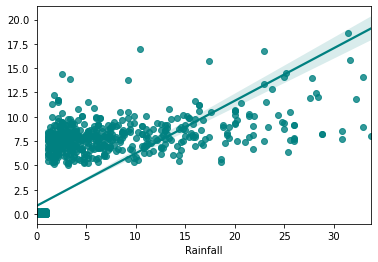

In [211]:
Final_model2 = RandomForestRegressor(criterion='mse', max_depth=6, max_features='auto',n_estimators=200)
Final_model2.fit(X_train, Y_train)
pred = Final_model2.predict(X_test)
print('R2_Score:',r2_score(Y_test,pred)*100)
print("RMSE value:",np.sqrt(metrics.mean_squared_error(Y_test, pred)))
print('MAE:',metrics.mean_absolute_error(Y_test, pred))
print('MSE:',metrics.mean_squared_error(Y_test, pred))

# Visualizing the predicted values
sns.regplot(Y_test,pred,color="teal")
plt.show()

# Saving the model

In [212]:
# Saving the model using .pkl
import joblib
joblib.dump(Final_model2,"WeatherForecastRainfall.pkl")

['WeatherForecastRainfall.pkl']

We have saved the model using joblib library.

# Predicting the saved model

In [215]:
# Loading the saved model
Model2=joblib.load("WeatherForecastRainfall.pkl")

#Prediction
prediction_Rain = Model2.predict(X_test)
prediction_Rain

array([ 0.02770936,  0.02753769,  0.04195897, ..., 10.23218308,
        0.0346546 ,  0.05026664])

Here we have loaded our saved model of prediction for Rainfall and got the predicted Rainfall values which are displayed above.

In [216]:
pd.DataFrame([Model2.predict(X_test)[:],Y_test[:]],index=["Predicted","Original"]).T

,Predicted,Original
0,0.027709,0.0
1,0.027538,0.0
2,0.041959,0.0
3,6.682521,1.4
4,0.108798,0.2
...,...,...
2293,0.041933,0.0
2294,9.708371,4.2
2295,10.232183,14.8
2296,0.034655,0.0


We have created a DataFrame of Actual and Predicted Rainfall values . Here Actual Rainfall and predicted Rainfall values are almost same.